In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

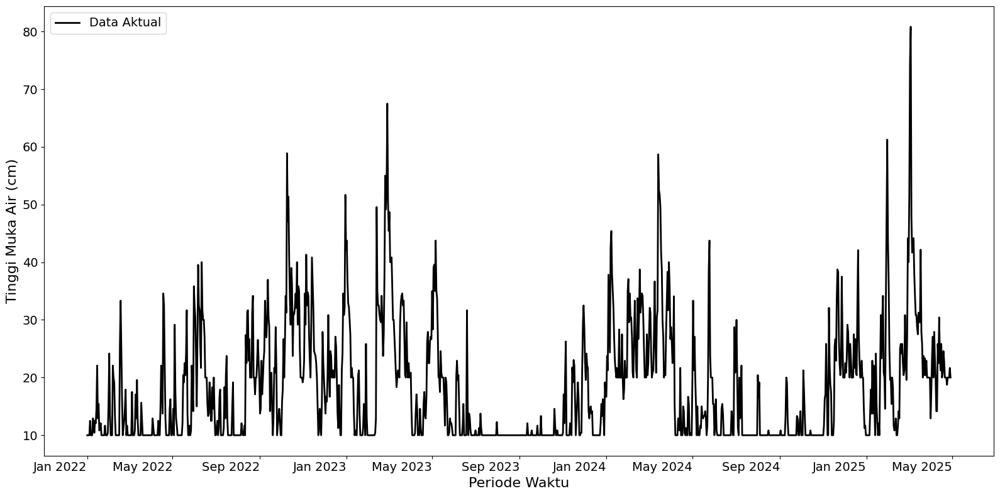

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

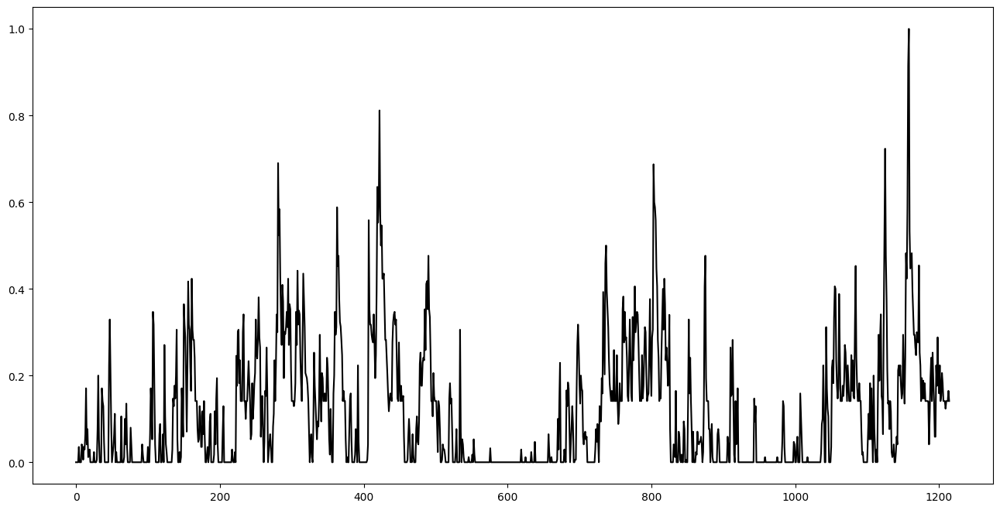

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        50,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Sliding Window Cross Validation

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.0691 - val_loss: 0.0231
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0145 - val_loss: 0.0381
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0097 - val_loss: 0.0368
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0065 - val_loss: 0.0327
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0081 - val_loss: 0.0365
Epoch 6/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0073 - val_loss: 0.0338
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 49.16681203652782 %
mape test = 82.98895237073253 %


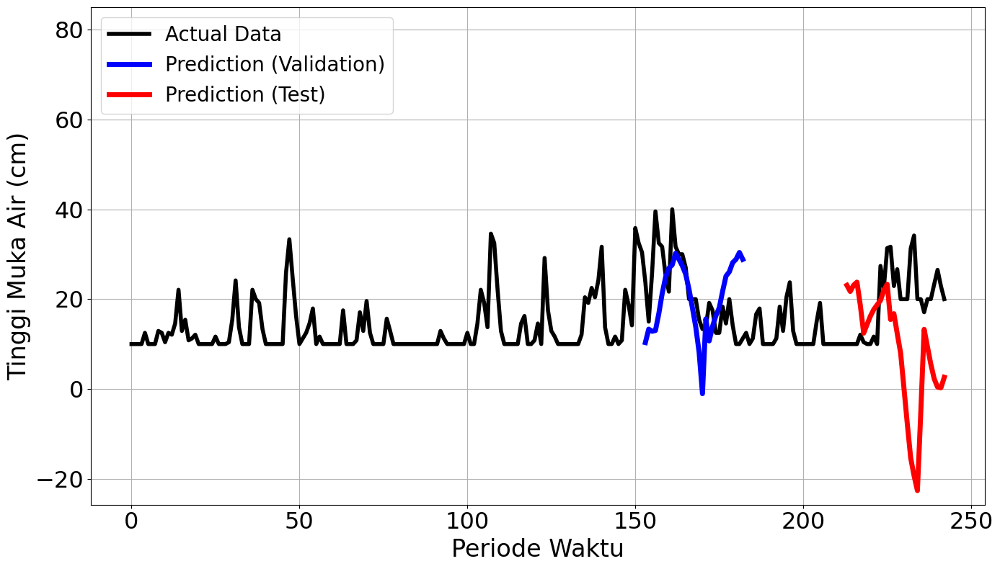

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.1291 - val_loss: 0.0493
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0189 - val_loss: 0.0433
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0155 - val_loss: 0.0610
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0173 - val_loss: 0.0303
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0177 - val_loss: 0.0363
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0076 - val_loss: 0.0372
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0095 - val_loss: 0.0468
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0117 - val_loss: 0.0427
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0127Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0127 - val_loss: 0.0383
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 59.9

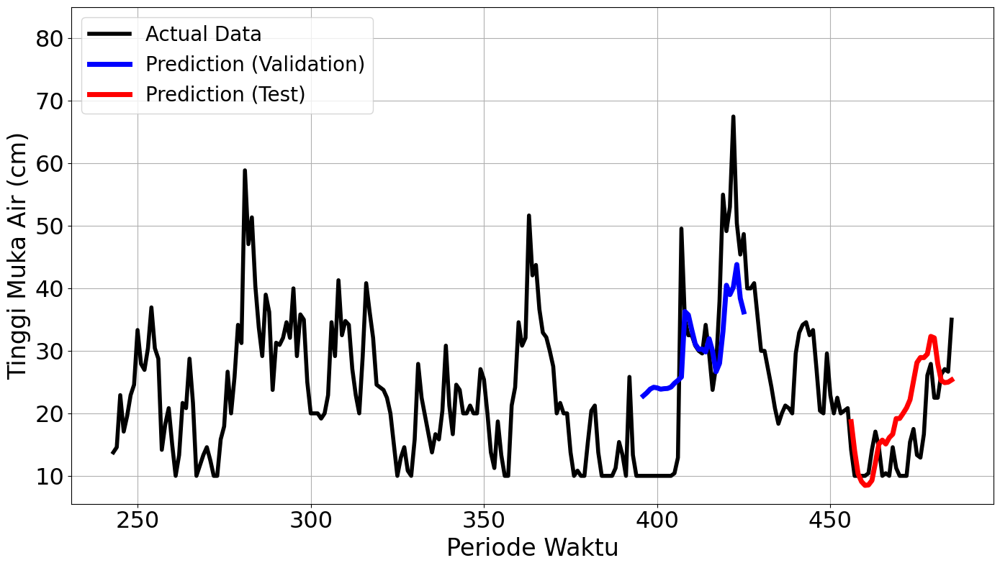

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0980 - val_loss: 0.0013
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0053 - val_loss: 6.9601e-04
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0053 - val_loss: 0.0013
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0045 - val_loss: 3.5098e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0090 - val_loss: 0.0017
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0056 - val_loss: 0.0031
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0026 - val_loss: 4.9399e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0034 - val_loss: 8.5816e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0046 - val_loss: 3.0957e-04
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0029 - val_loss: 4.2376e-04
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0021 - val_loss: 0.0037
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 

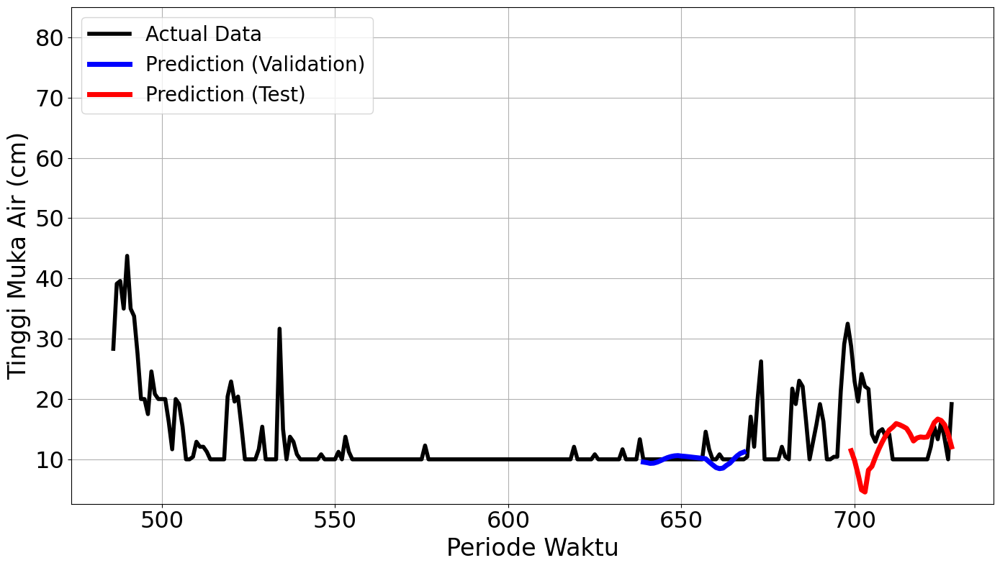

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0813 - val_loss: 0.0984
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.0328 - val_loss: 0.0256
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0233 - val_loss: 0.0112
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0290 - val_loss: 0.0049
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0141 - val_loss: 0.0046
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0096 - val_loss: 0.0047
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0184 - val_loss: 0.0038
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0156 - val_loss: 0.0112
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0124 - val_loss: 0.0056
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0079 - val_loss: 0.0042
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0148 - val_loss: 0.0031
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0

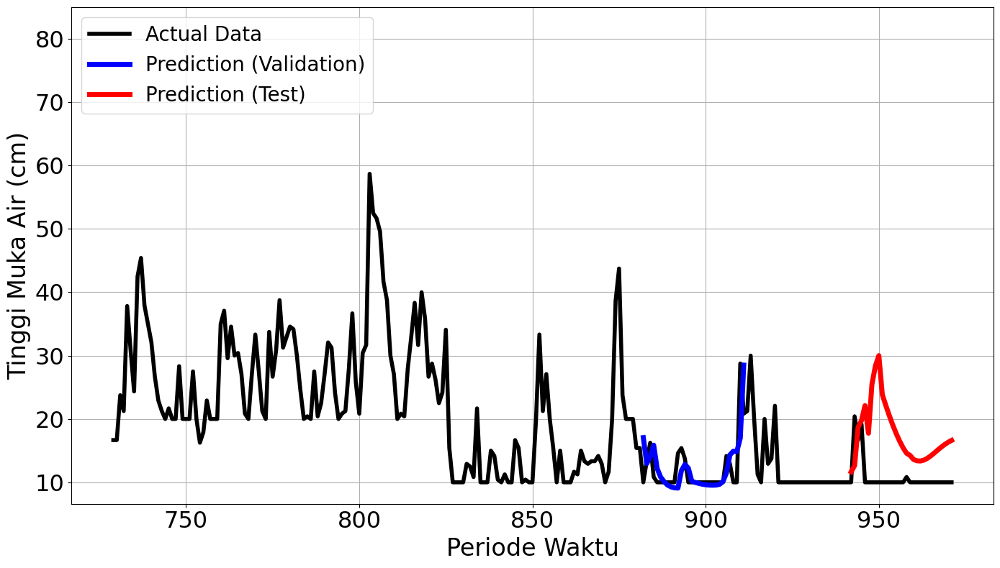

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.0807 - val_loss: 0.0211
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0131 - val_loss: 0.0291
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0124 - val_loss: 0.0298
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0144 - val_loss: 0.0196
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0093 - val_loss: 0.0224
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0090 - val_loss: 0.0264
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0093 - val_loss: 0.0233
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0083 - val_loss: 0.0187
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0087 - val_loss: 0.0254
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0093 - val_loss: 0.0261
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0099 - val_loss: 0.0204
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0

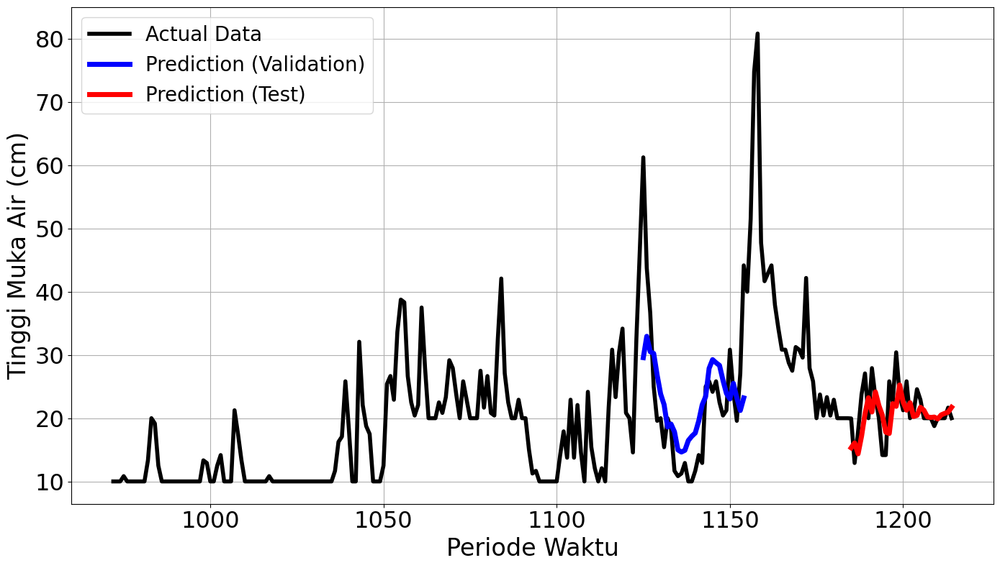

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3265
Final Average MAPE Test: 0.4937
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0691 - val_loss: 0.0231
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0145 - val_loss: 0.0381
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0097 - val_loss: 0.0368
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0065 - val_loss: 0.0327
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0081 - val_loss: 0.0365
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0073 - val_loss: 0.0338
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
mape validation = 49.16681203652782 %
mape test = 82.98895237073253 %


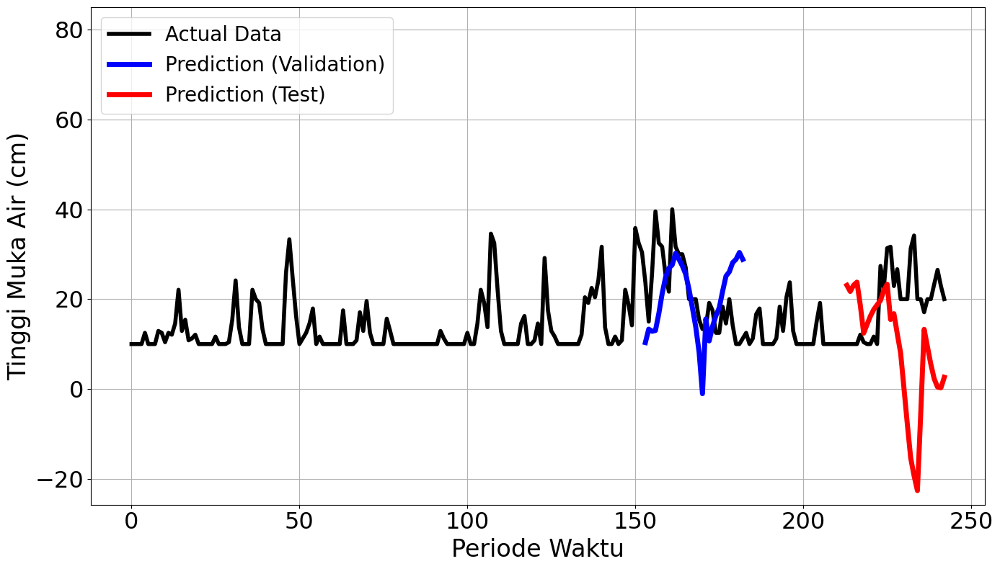

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1291 - val_loss: 0.0493
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0189 - val_loss: 0.0433
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0155 - val_loss: 0.0610
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0173 - val_loss: 0.0303
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0177 - val_loss: 0.0363
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0076 - val_loss: 0.0372
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0095 - val_loss: 0.0468
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0117 - val_loss: 0.0427
Epoch 9/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0127Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0127 - val_loss: 0.0383
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
mape validation = 59.9

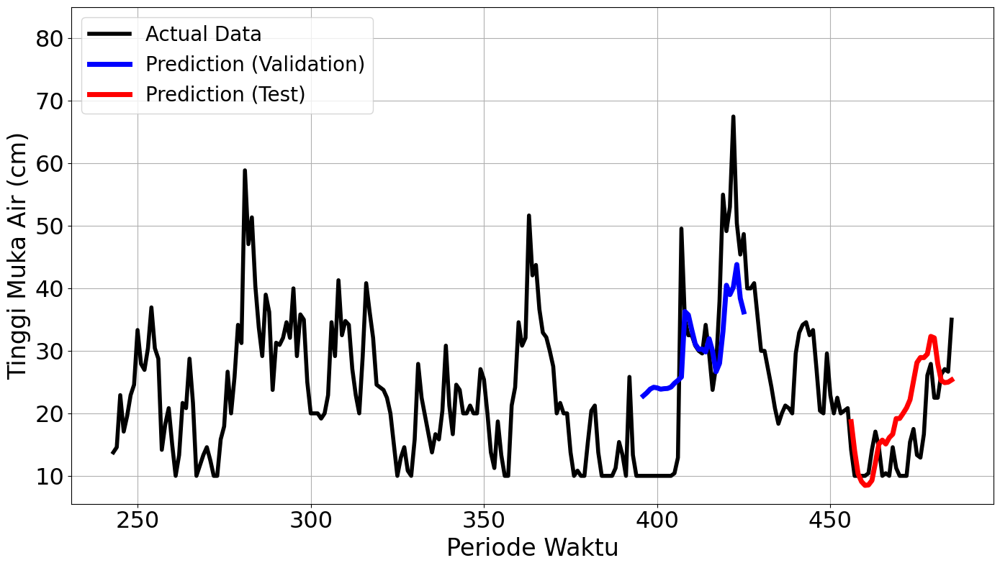

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.0980 - val_loss: 0.0013
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0053 - val_loss: 6.9601e-04
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0053 - val_loss: 0.0013
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0045 - val_loss: 3.5098e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0090 - val_loss: 0.0017
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0056 - val_loss: 0.0031
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0026 - val_loss: 4.9399e-04
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0034 - val_loss: 8.5816e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.0046 - val_loss: 3.0957e-04
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0029 - val_loss: 4.2376e-04
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0021 - val_loss: 0.0037
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 

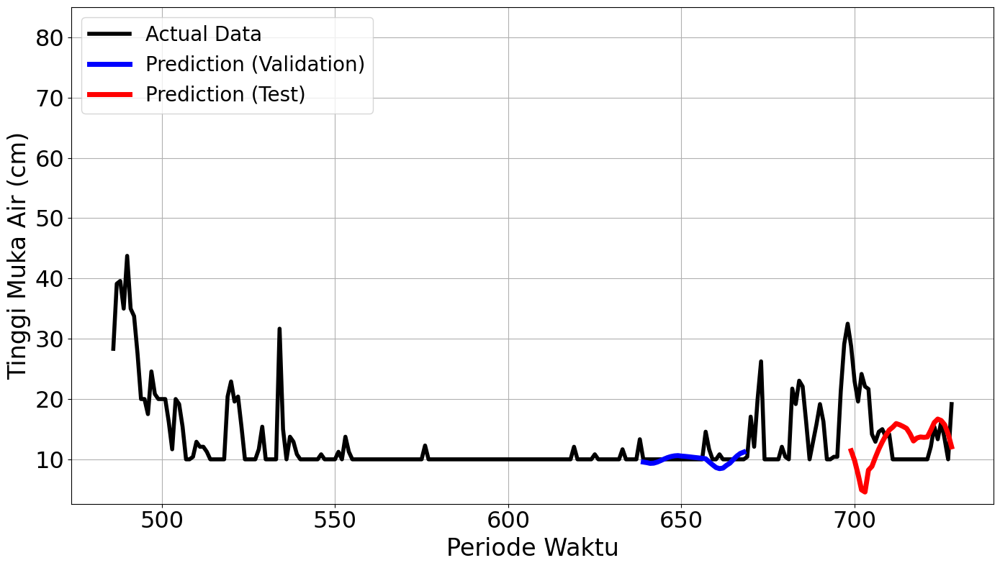

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0813 - val_loss: 0.0984
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0328 - val_loss: 0.0256
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0233 - val_loss: 0.0112
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.0290 - val_loss: 0.0049
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0141 - val_loss: 0.0046
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0096 - val_loss: 0.0047
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0184 - val_loss: 0.0038
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.0156 - val_loss: 0.0112
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - loss: 0.0124 - val_loss: 0.0056
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0079 - val_loss: 0.0042
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0148 - val_loss: 0.0031
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0

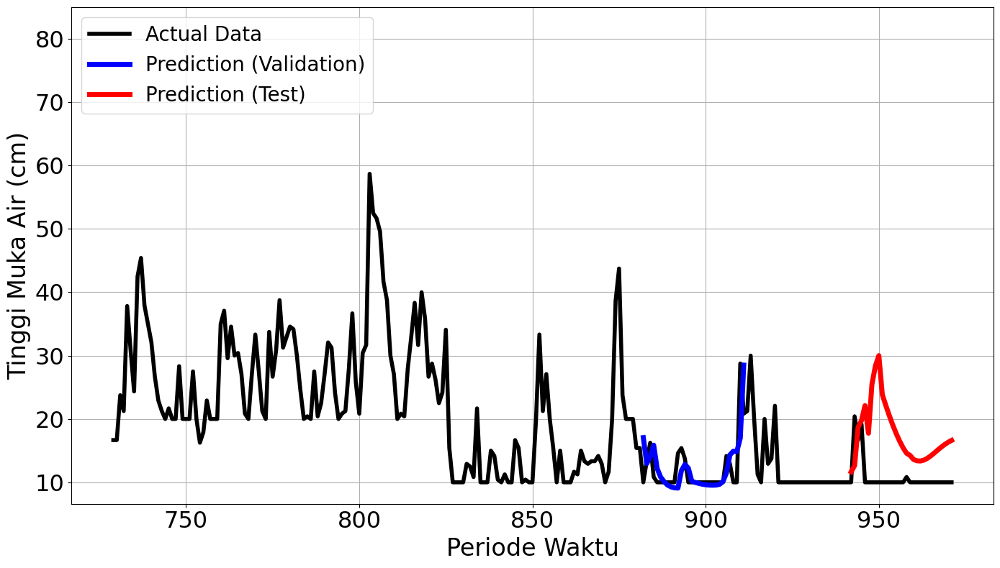

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0807 - val_loss: 0.0211
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0131 - val_loss: 0.0291
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.0124 - val_loss: 0.0298
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0144 - val_loss: 0.0196
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0093 - val_loss: 0.0224
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0090 - val_loss: 0.0264
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0093 - val_loss: 0.0233
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0083 - val_loss: 0.0187
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - val_loss: 0.0254
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0093 - val_loss: 0.0261
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0099 - val_loss: 0.0204
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0

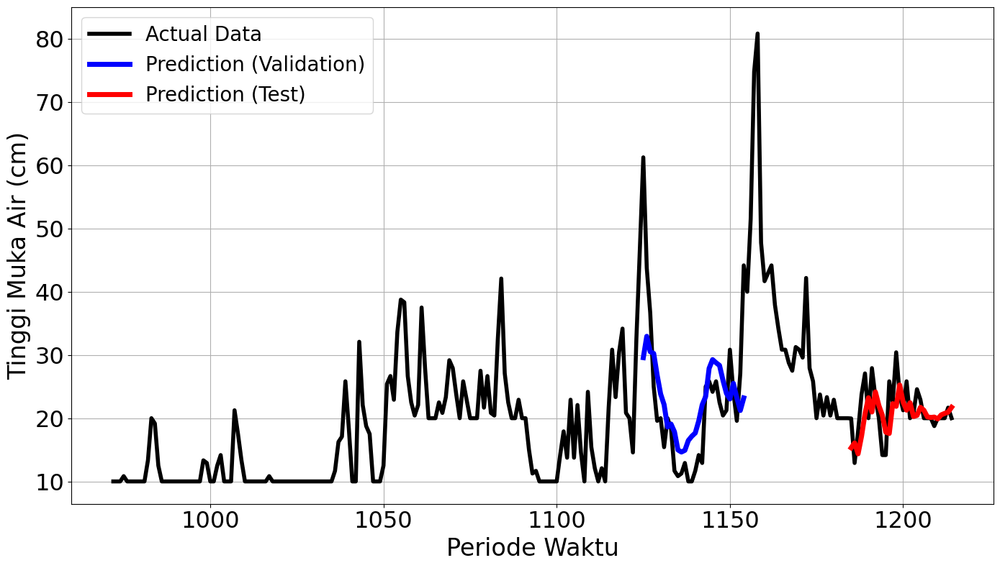

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3265
Final Average MAPE Test: 0.4937
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 0.2890 - val_loss: 0.0389
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0295 - val_loss: 0.1624
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0359 - val_loss: 0.1567
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0149 - val_loss: 0.1534
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0112 - val_loss: 0.1750
Epoch 6/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0107Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0106 - val_loss: 0.2389
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 434ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
mape validation = 65.00732820480616 %
mape test = 127.69522318391846 %


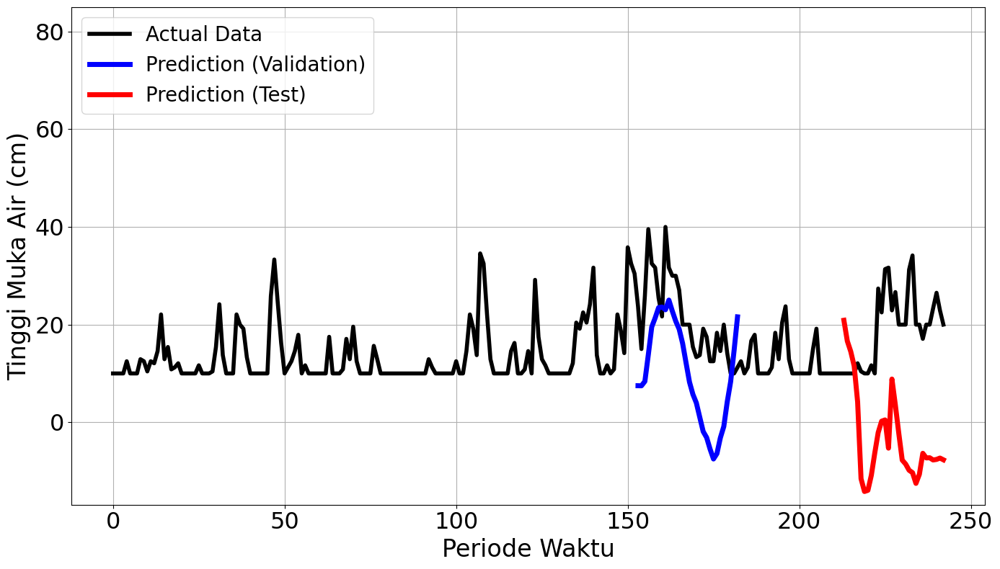

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.2443 - val_loss: 0.3687
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0419 - val_loss: 0.2147
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0749 - val_loss: 0.1786
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0303 - val_loss: 0.0941
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0330 - val_loss: 0.1016
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0203 - val_loss: 0.1250
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0204 - val_loss: 0.1157
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0181 - val_loss: 0.1080
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0168Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0165 - val_loss: 0.1080
Epoch 00009: early stopping
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 345ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
mape validation = 112.20341324379235 %
mape test = 57.73277810262639 %


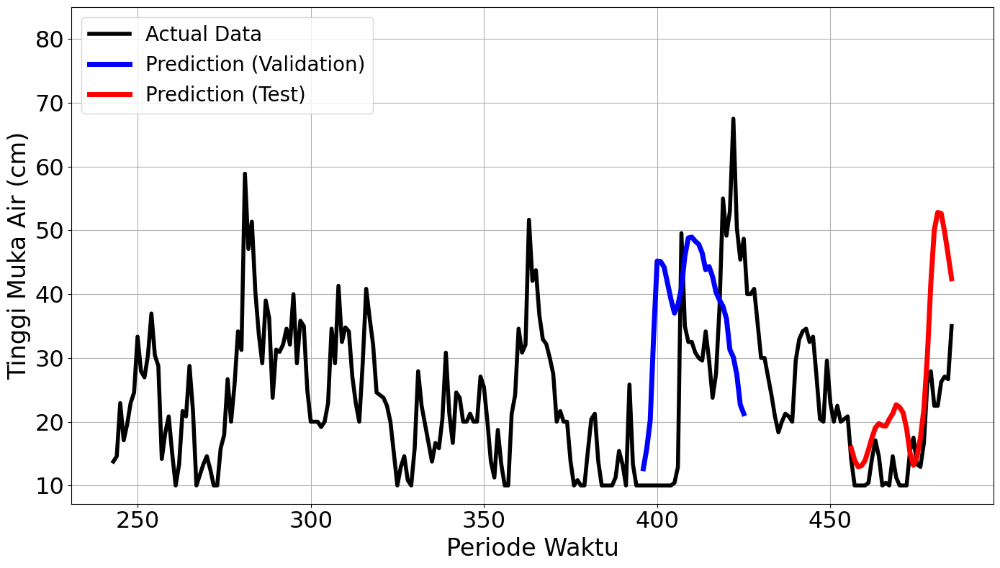

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.1315 - val_loss: 0.0262
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0252 - val_loss: 6.5710e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0133 - val_loss: 4.2796e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0083 - val_loss: 3.5467e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0044 - val_loss: 8.9660e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0041 - val_loss: 0.0016
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0037 - val_loss: 5.4241e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0030 - val_loss: 5.8927e-04
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0026Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0025 - val_loss: 5.5204e-04
Epoch 00009: early stopping


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 362ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
mape validation = 7.128103528869575 %
mape test = 58.22728895065741 %


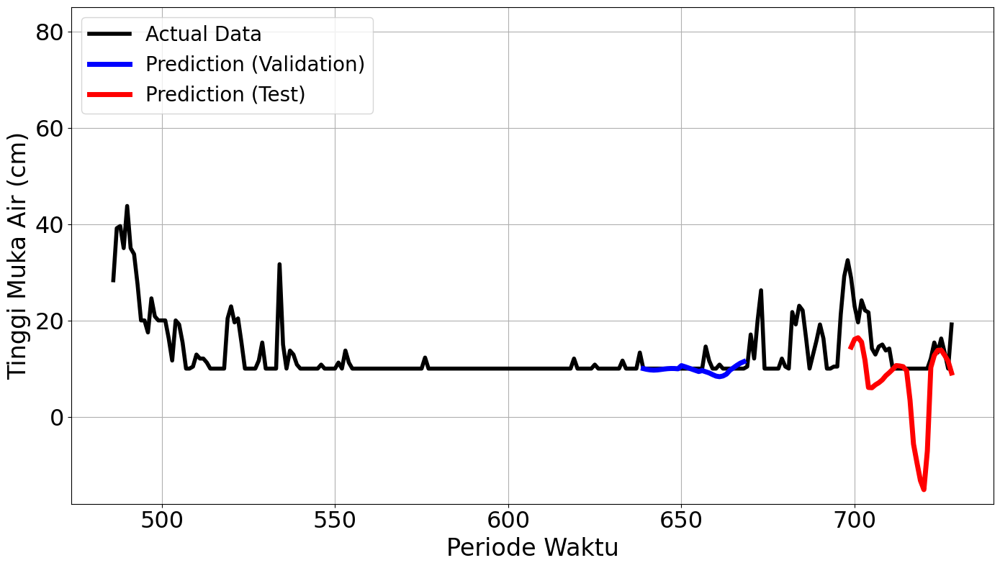

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - loss: 0.1716 - val_loss: 0.0778
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0667 - val_loss: 0.0875
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0414 - val_loss: 0.0415
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0273 - val_loss: 0.0517
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0207 - val_loss: 0.0378
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0158 - val_loss: 0.0251
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0187 - val_loss: 0.0239
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0255 - val_loss: 0.0273
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0167 - val_loss: 0.0189
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0248 - val_loss: 0.0149
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0146 - val_loss: 0.0209
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0123 - val_loss: 0.0227


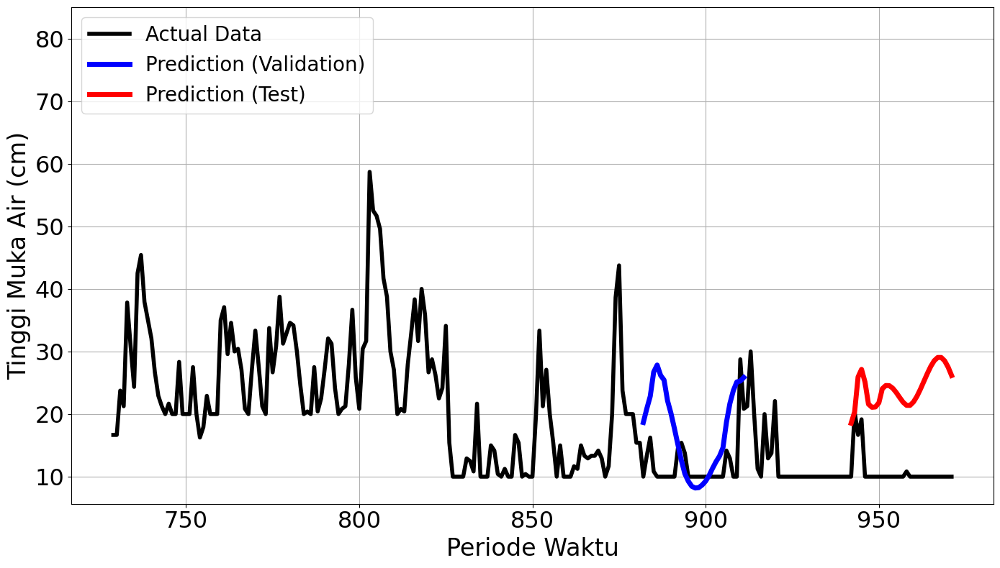

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.1360 - val_loss: 0.1334
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0893 - val_loss: 0.0290
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1153 - val_loss: 0.0475
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0190 - val_loss: 0.0266
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0135 - val_loss: 0.0262
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0151 - val_loss: 0.0285
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0131 - val_loss: 0.0333
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0117 - val_loss: 0.0356
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0148 - val_loss: 0.0366
Epoch 10/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0102Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0097 - val_loss: 0.0348
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 350ms/

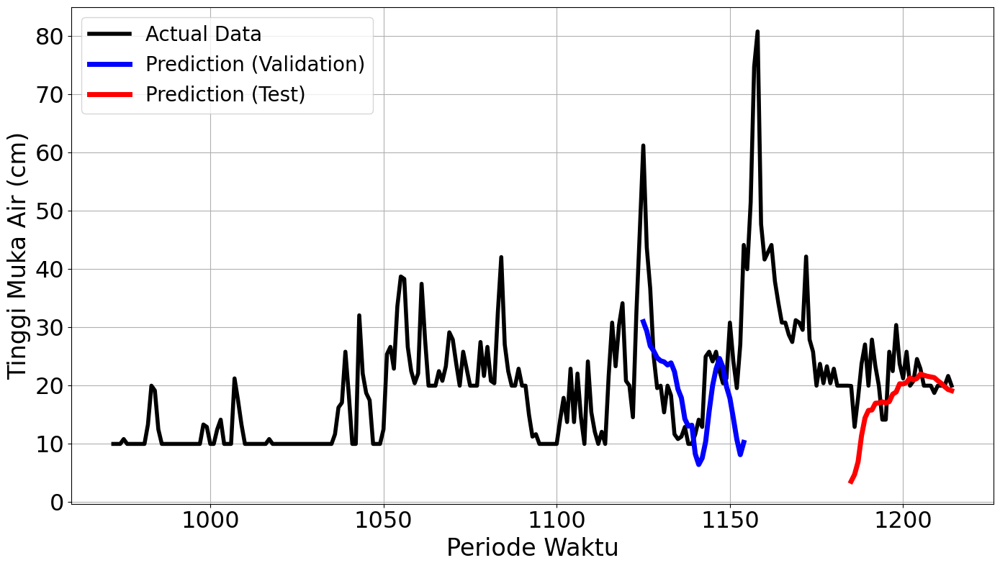

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5631
Final Average MAPE Test: 0.7934
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 241ms/step - loss: 0.2890 - val_loss: 0.0389
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0295 - val_loss: 0.1624
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0359 - val_loss: 0.1567
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0149 - val_loss: 0.1534
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0112 - val_loss: 0.1750
Epoch 6/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0107Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0106 - val_loss: 0.2389
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 407ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
mape validation = 65.00732820480616 %
mape test = 127.69522318391846 %


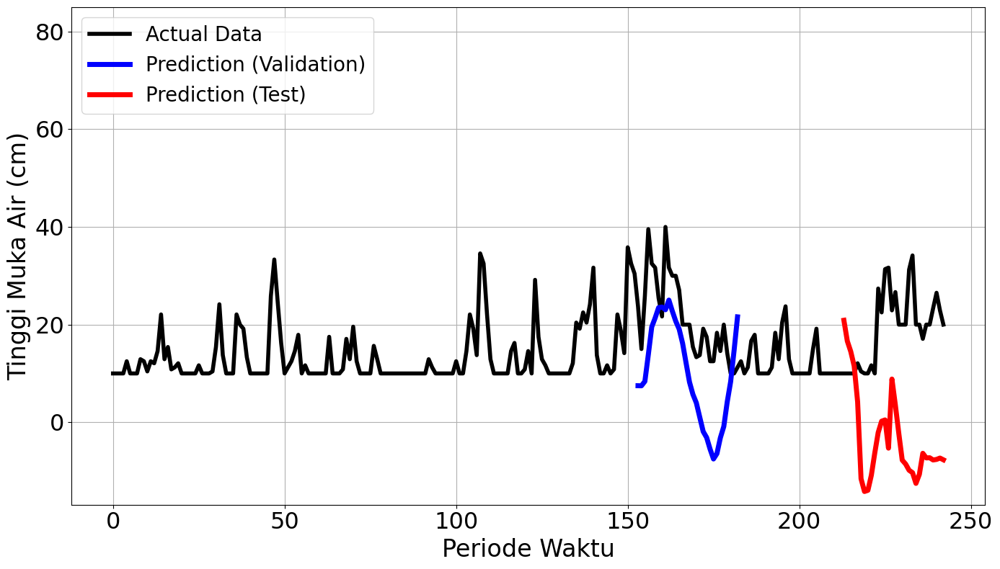

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.2443 - val_loss: 0.3687
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0419 - val_loss: 0.2147
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0749 - val_loss: 0.1786
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0303 - val_loss: 0.0941
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0330 - val_loss: 0.1016
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0203 - val_loss: 0.1250
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0204 - val_loss: 0.1157
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0181 - val_loss: 0.1080
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0167Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0165 - val_loss: 0.1080
Epoch 00009: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
mape validation = 112.20341324379235 %
map

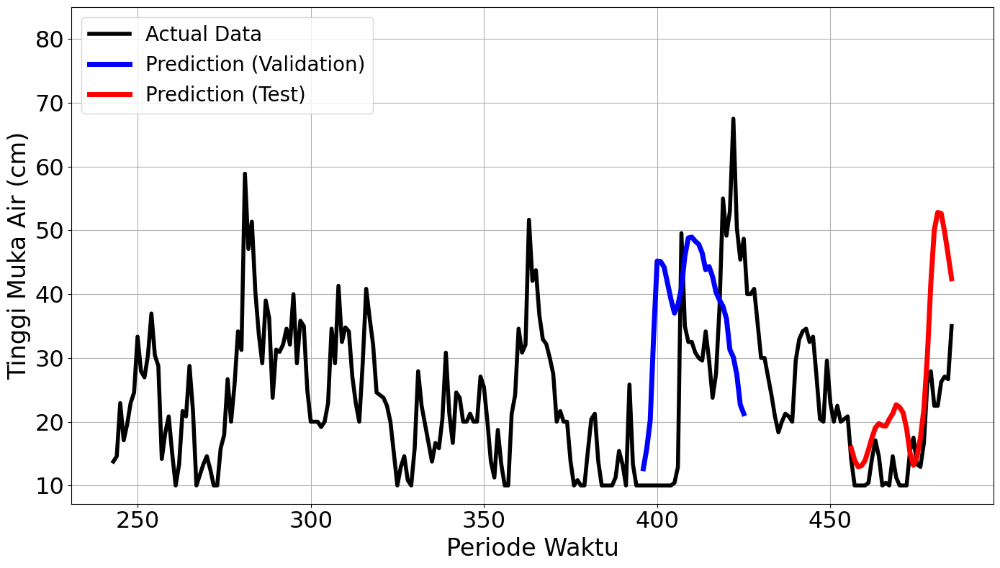

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 138ms/step - loss: 0.1315 - val_loss: 0.0262
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0252 - val_loss: 6.5710e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0133 - val_loss: 4.2796e-04
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0083 - val_loss: 3.5467e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0044 - val_loss: 8.9660e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0041 - val_loss: 0.0016
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0037 - val_loss: 5.4241e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0030 - val_loss: 5.8927e-04
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0026Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0025 - val_loss: 5.5204e-04
Epoch 00009: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 370ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
mape validatio

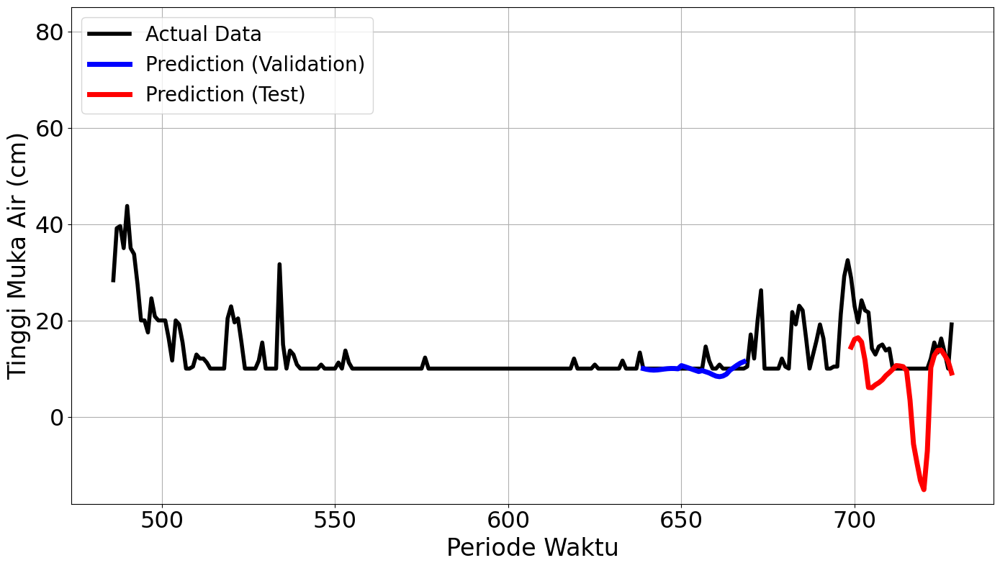

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.1716 - val_loss: 0.0778
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0667 - val_loss: 0.0875
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0414 - val_loss: 0.0415
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0273 - val_loss: 0.0517
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0207 - val_loss: 0.0378
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0158 - val_loss: 0.0251
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0187 - val_loss: 0.0239
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0255 - val_loss: 0.0273
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0167 - val_loss: 0.0189
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0248 - val_loss: 0.0149
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0146 - val_loss: 0.0209
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0123 - val_loss: 0.0227


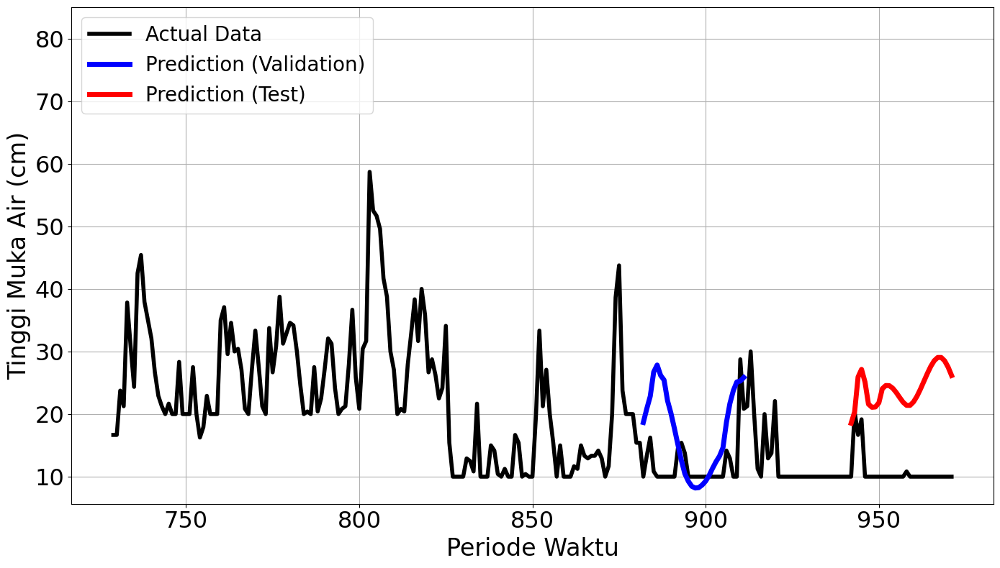

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.1360 - val_loss: 0.1334
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0893 - val_loss: 0.0290
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.1153 - val_loss: 0.0475
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0190 - val_loss: 0.0266
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0135 - val_loss: 0.0262
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0151 - val_loss: 0.0285
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0131 - val_loss: 0.0333
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0117 - val_loss: 0.0356
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0148 - val_loss: 0.0366
Epoch 10/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0102Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0097 - val_loss: 0.0348
Epoch 00010: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/

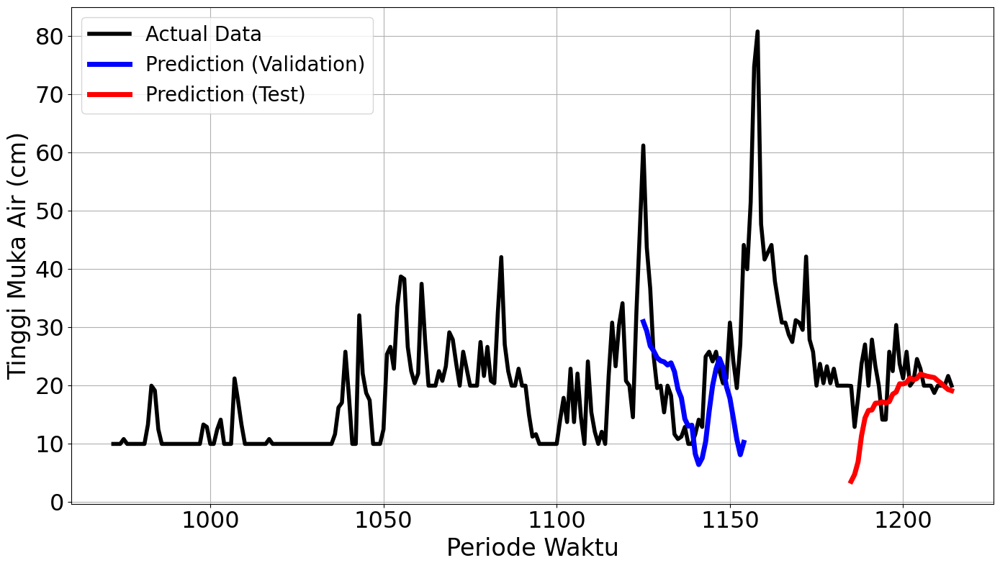

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5631
Final Average MAPE Test: 0.7934


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 627ms/step - loss: 0.6360 - val_loss: 0.1151
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0878 - val_loss: 0.0143
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0339 - val_loss: 0.0409
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0250 - val_loss: 0.1163
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0281 - val_loss: 0.1896
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0276 - val_loss: 0.2311
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0266 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0259 - val_loss: 0.2489
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
mape validation = 40.61003619723774 %
mape test = 86.901713387291 %


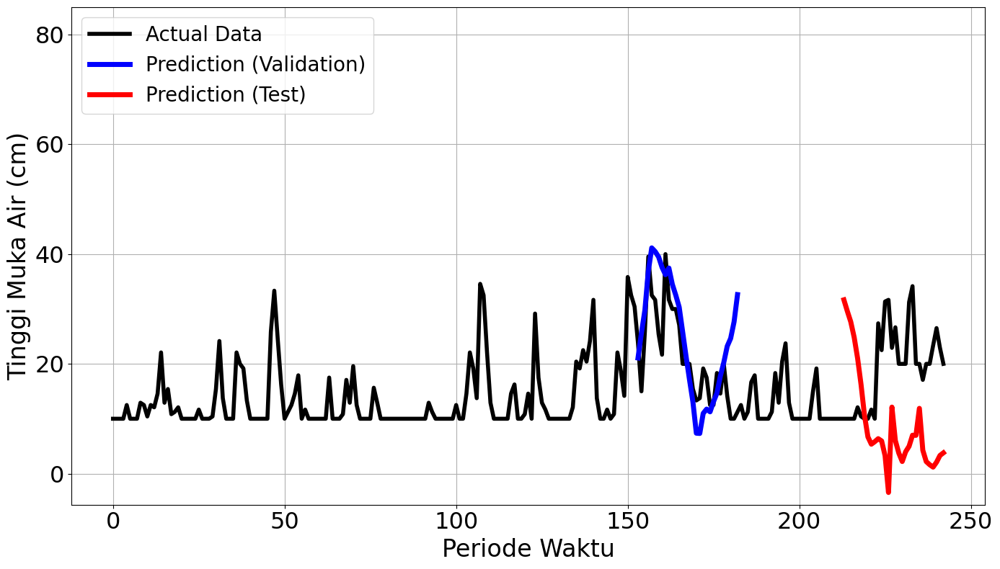

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 900ms/step - loss: 0.2161 - val_loss: 0.5269
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.1226 - val_loss: 0.3805
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.1197 - val_loss: 0.2976
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.0745 - val_loss: 0.2873
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - loss: 0.0431 - val_loss: 0.2941
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.0393 - val_loss: 0.3098
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0399 - val_loss: 0.3115
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.0323 - val_loss: 0.3054
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0242 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0241 - val_loss: 0.2959
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
mape validation = 216.96326626370

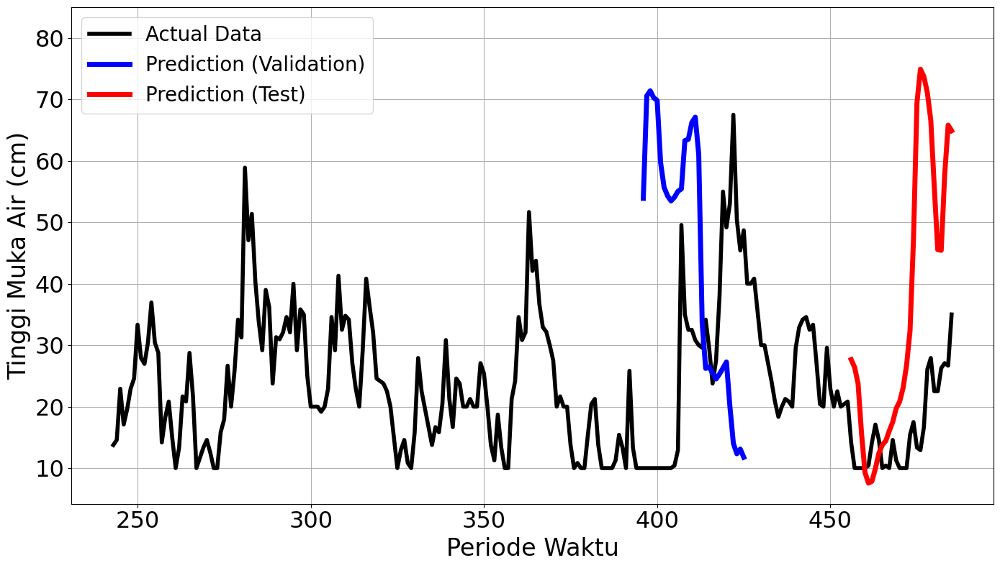

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 639ms/step - loss: 0.5108 - val_loss: 0.0117
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0520 - val_loss: 0.0058
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 0.0220 - val_loss: 0.0024
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0137 - val_loss: 0.0017
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0084 - val_loss: 0.0014
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0057 - val_loss: 0.0039
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0110 - val_loss: 0.0040
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0069 - val_loss: 6.9835e-04
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0043 - val_loss: 0.0011
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0050 - val_loss: 0.0013
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0034 - val_loss: 8.3214e-04
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0035 

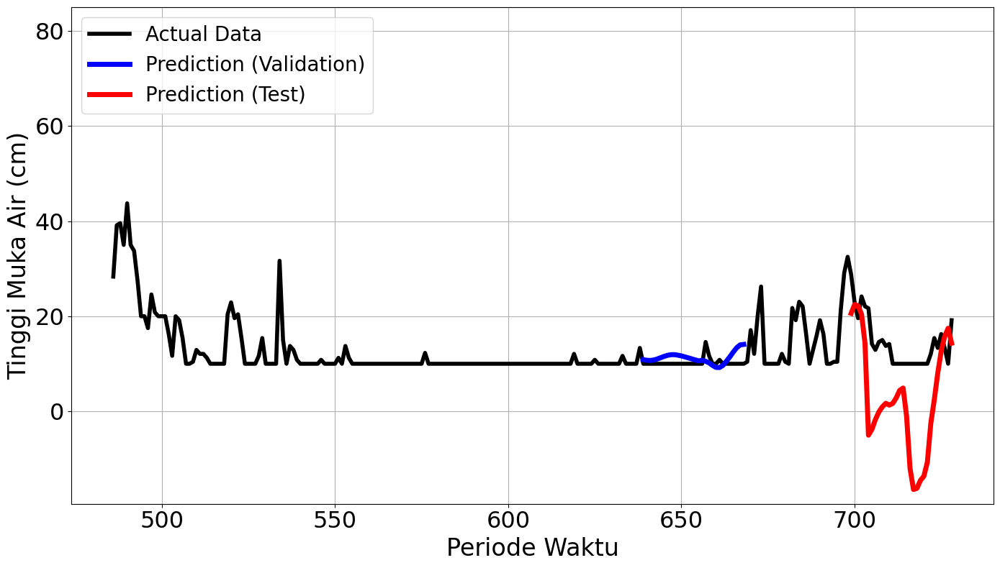

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 600ms/step - loss: 0.1963 - val_loss: 0.3321
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - loss: 0.2170 - val_loss: 0.0708
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0736 - val_loss: 0.0322
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0241 - val_loss: 0.0229
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0316 - val_loss: 0.0202
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0380 - val_loss: 0.0194
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0287 - val_loss: 0.0202
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0361 - val_loss: 0.0219
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0279 - val_loss: 0.0244
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0295 - val_loss: 0.0245
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0258 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step 

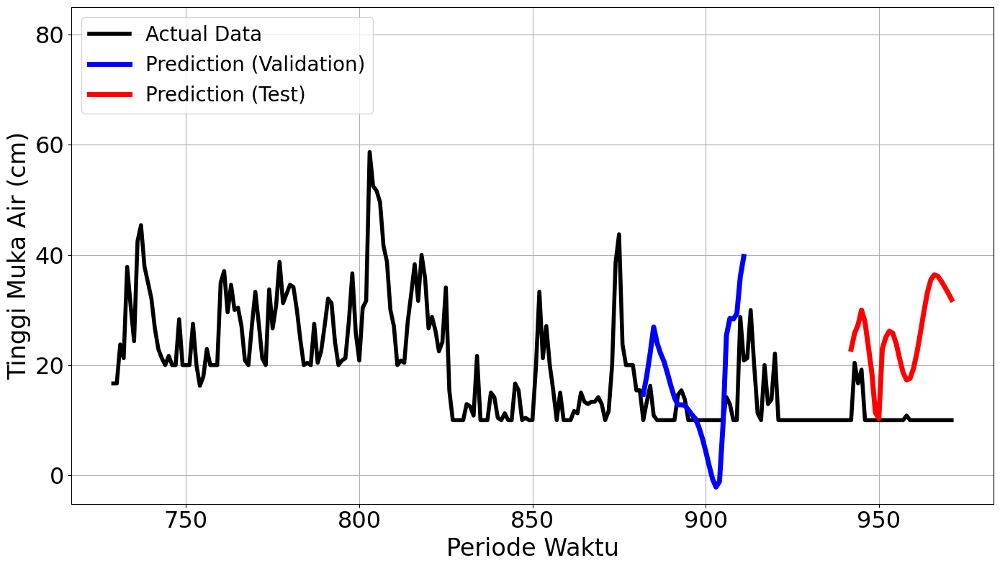

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 596ms/step - loss: 0.2337 - val_loss: 0.0148
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.0422 - val_loss: 0.0257
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0393 - val_loss: 0.0321
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - loss: 0.0249 - val_loss: 0.0482
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0290 - val_loss: 0.0449
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0144 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0144 - val_loss: 0.0451
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
mape validation = 29.31748334658108 %
mape test = 51.902570600732844 %


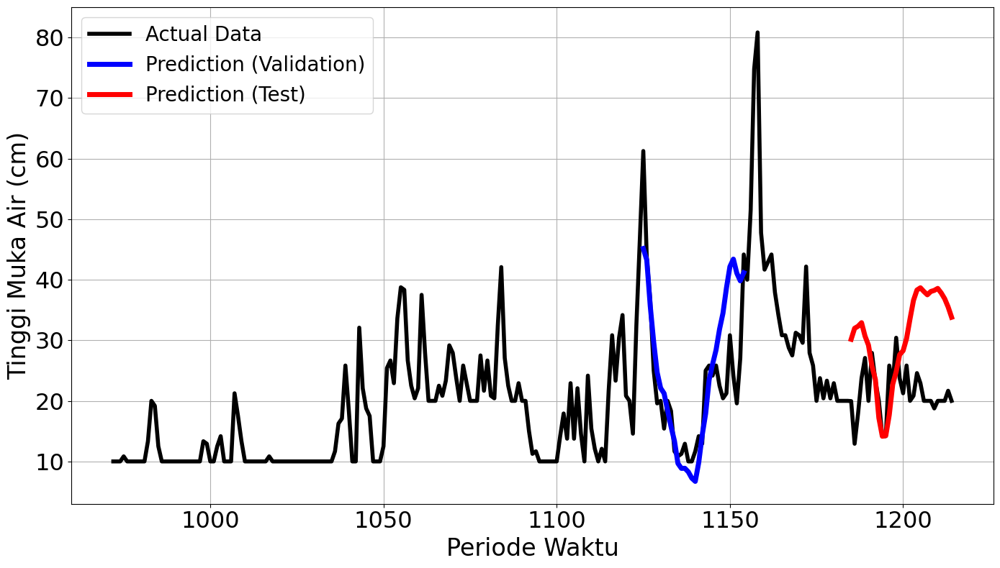

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.7447
Final Average MAPE Test: 1.0137
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 633ms/step - loss: 0.6360 - val_loss: 0.1151
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0878 - val_loss: 0.0143
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0339 - val_loss: 0.0409
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0250 - val_loss: 0.1163
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0281 - val_loss: 0.1896
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0276 - val_loss: 0.2311
Epoch 7/150
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0286Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0259 - val_loss: 0.2489
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
mape validation = 40.61003619723774 %
mape test = 86.901713387291 %


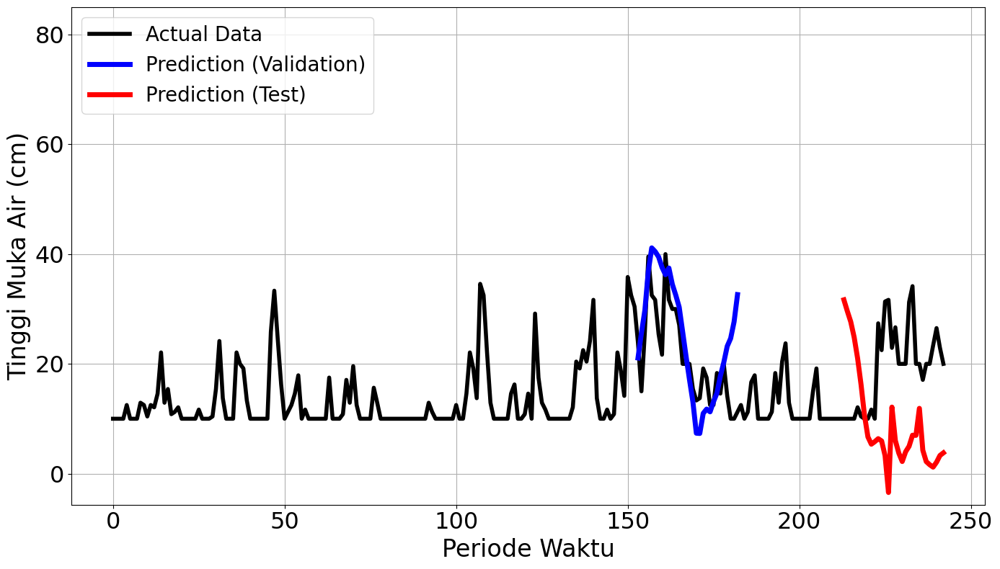

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 587ms/step - loss: 0.2161 - val_loss: 0.5269
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.1226 - val_loss: 0.3805
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1197 - val_loss: 0.2976
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0745 - val_loss: 0.2873
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0431 - val_loss: 0.2941
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0393 - val_loss: 0.3098
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0399 - val_loss: 0.3115
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0323 - val_loss: 0.3054
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0242 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0241 - val_loss: 0.2959
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
mape validation = 216.96326626370

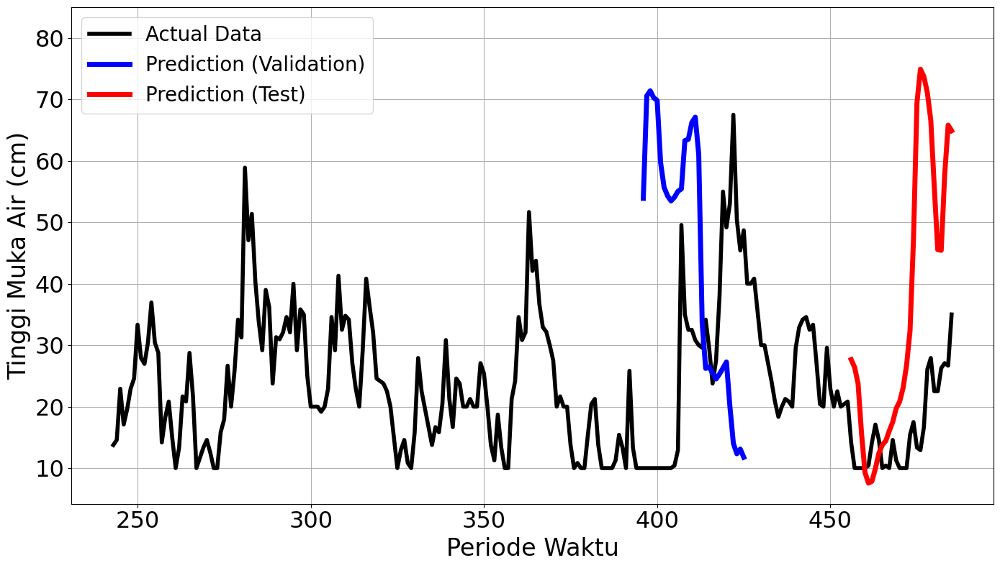

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 675ms/step - loss: 0.5108 - val_loss: 0.0117
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0520 - val_loss: 0.0058
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.0220 - val_loss: 0.0024
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.0137 - val_loss: 0.0017
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - loss: 0.0084 - val_loss: 0.0014
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - loss: 0.0057 - val_loss: 0.0039
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.0110 - val_loss: 0.0040
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.0069 - val_loss: 6.9835e-04
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0043 - val_loss: 0.0011
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.0050 - val_loss: 0.0013
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.0034 - val_loss: 8.3214e-04
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.0035 

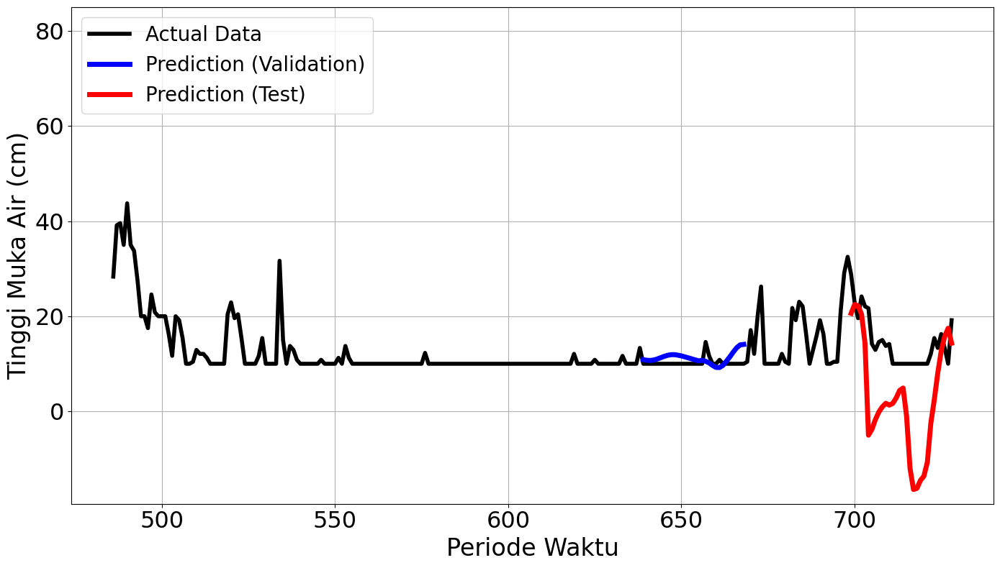

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 607ms/step - loss: 0.1963 - val_loss: 0.3321
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.2170 - val_loss: 0.0708
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0736 - val_loss: 0.0322
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0241 - val_loss: 0.0229
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0316 - val_loss: 0.0202
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0380 - val_loss: 0.0194
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0287 - val_loss: 0.0202
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0361 - val_loss: 0.0219
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0279 - val_loss: 0.0244
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0295 - val_loss: 0.0245
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0258Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step -

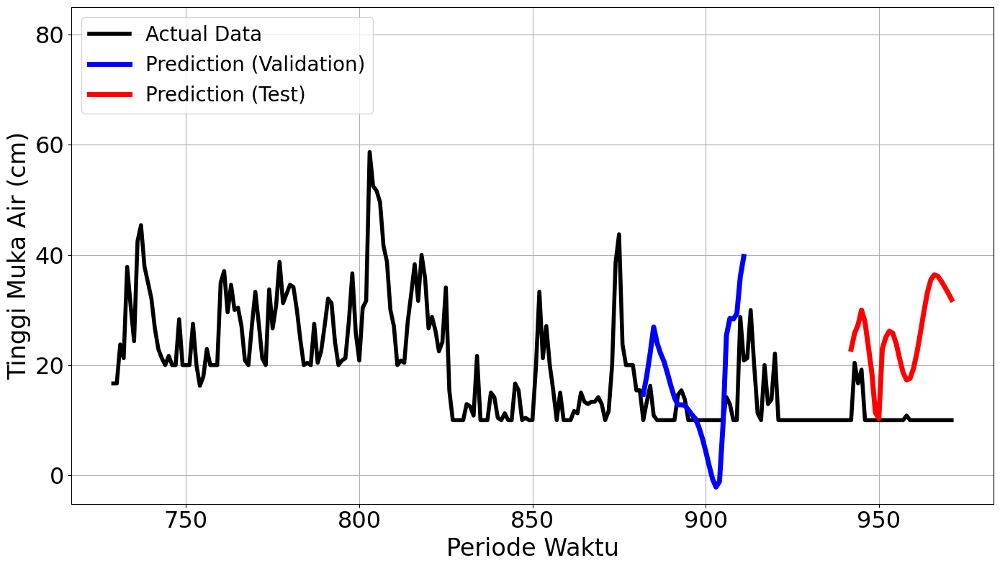

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 597ms/step - loss: 0.2337 - val_loss: 0.0148
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0422 - val_loss: 0.0257
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0393 - val_loss: 0.0321
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0249 - val_loss: 0.0482
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - loss: 0.0290 - val_loss: 0.0449
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0144 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0144 - val_loss: 0.0451
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
mape validation = 29.31748334658108 %
mape test = 51.902570600732844 %


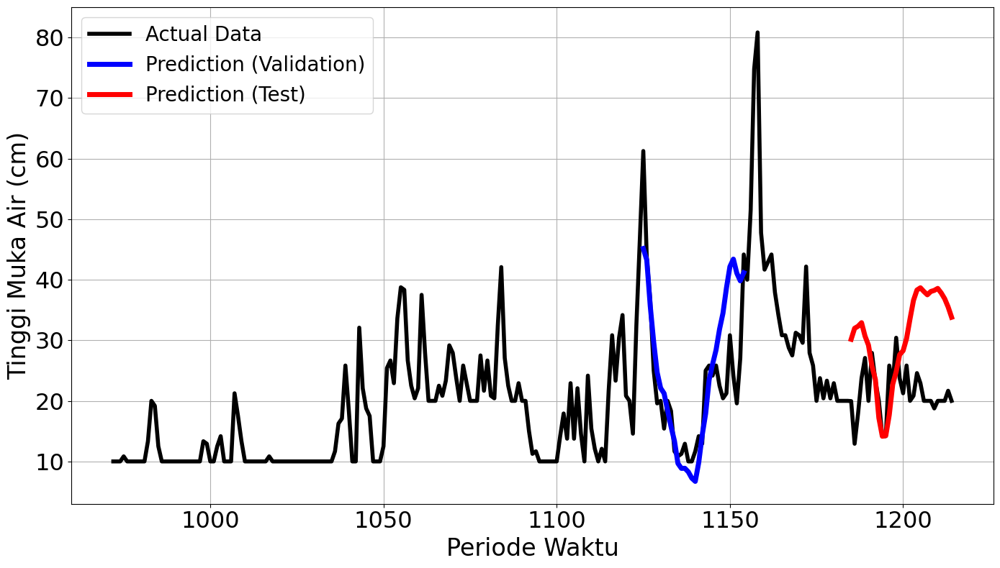

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.7447
Final Average MAPE Test: 1.0137
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.5838 - val_loss: 0.1902
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.2446 - val_loss: 0.1256
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.0995 - val_loss: 0.0688
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - loss: 0.0483 - val_loss: 0.0260
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - loss: 0.0344 - val_loss: 0.0238
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - loss: 0.0273 - val_loss: 0.0531
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - loss: 0.0227 - val_loss: 0.0872
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step - loss: 0.0216 - val_loss: 0.1064
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0217 - val_loss: 0.1107
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0182Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step - loss: 0.0182 - val_loss: 0.1094
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s

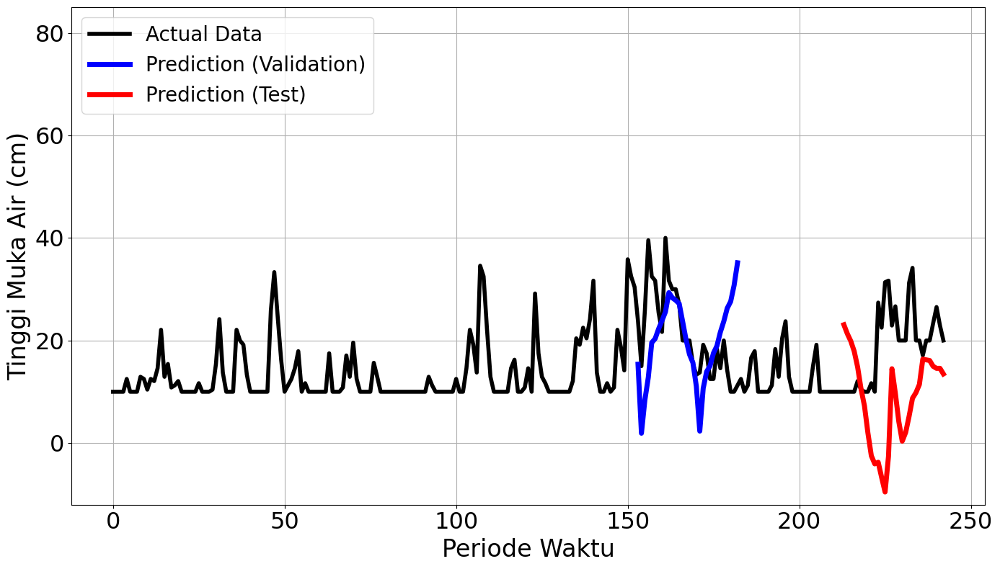

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.3707 - val_loss: 0.4799
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step - loss: 0.0843 - val_loss: 0.5341
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step - loss: 0.0515 - val_loss: 0.4834
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - loss: 0.0736 - val_loss: 0.4183
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.0763 - val_loss: 0.3667
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.0502 - val_loss: 0.3374
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - loss: 0.0383 - val_loss: 0.3201
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - loss: 0.0342 - val_loss: 0.3061
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 0.0281 - val_loss: 0.2947
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.0359 - val_loss: 0.2826
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0315 - val_loss: 0.2702
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - loss: 0.0299 - val_loss:

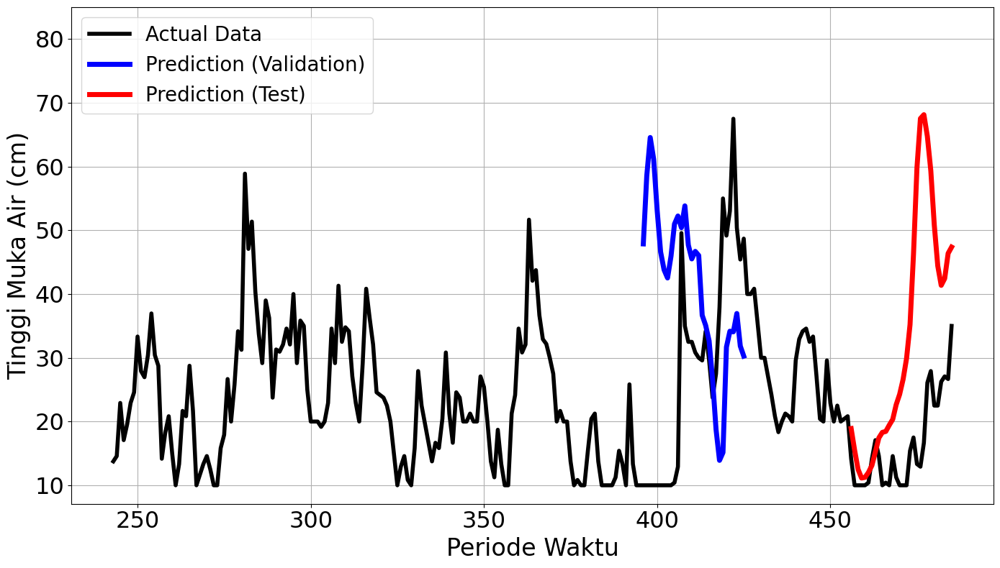

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.4453 - val_loss: 0.0056
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.1960 - val_loss: 0.0049
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - loss: 0.0781 - val_loss: 0.0084
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step - loss: 0.0326 - val_loss: 0.0063
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step - loss: 0.0144 - val_loss: 0.0030
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - loss: 0.0113 - val_loss: 0.0017
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step - loss: 0.0153 - val_loss: 0.0014
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - loss: 0.0175 - val_loss: 0.0015
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 0.0128 - val_loss: 0.0025
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - loss: 0.0090 - val_loss: 0.0036
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - loss: 0.0094 - val_loss: 0.0033
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0079Restoring mo

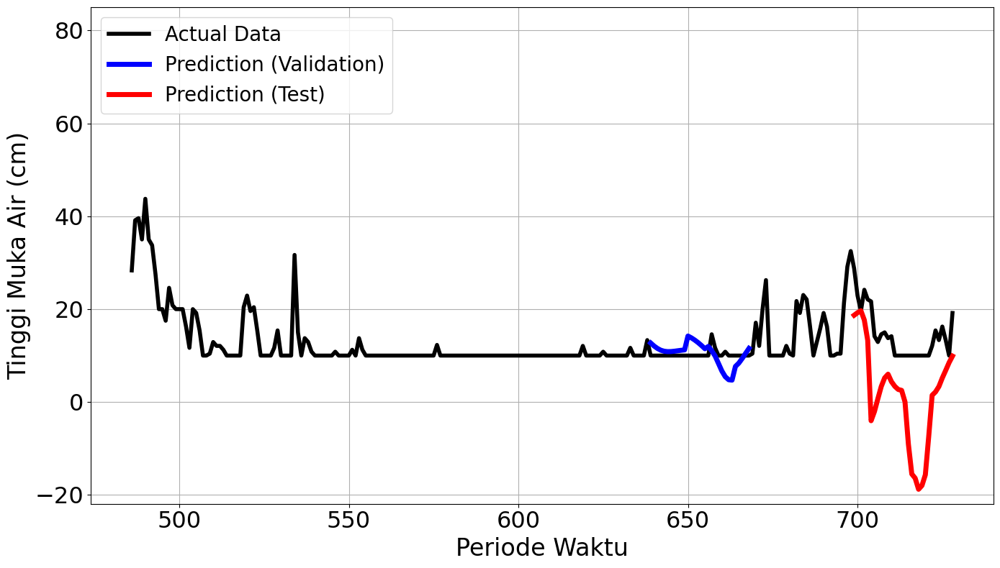

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.2826 - val_loss: 0.4934
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.1082 - val_loss: 0.2523
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - loss: 0.1029 - val_loss: 0.1212
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 0.0731 - val_loss: 0.0757
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.0449 - val_loss: 0.0533
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.0314 - val_loss: 0.0401
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step - loss: 0.0296 - val_loss: 0.0319
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - loss: 0.0278 - val_loss: 0.0269
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.0298 - val_loss: 0.0243
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.0364 - val_loss: 0.0236
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0267 - val_loss: 0.0243
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - loss: 0.0276 - val_loss:

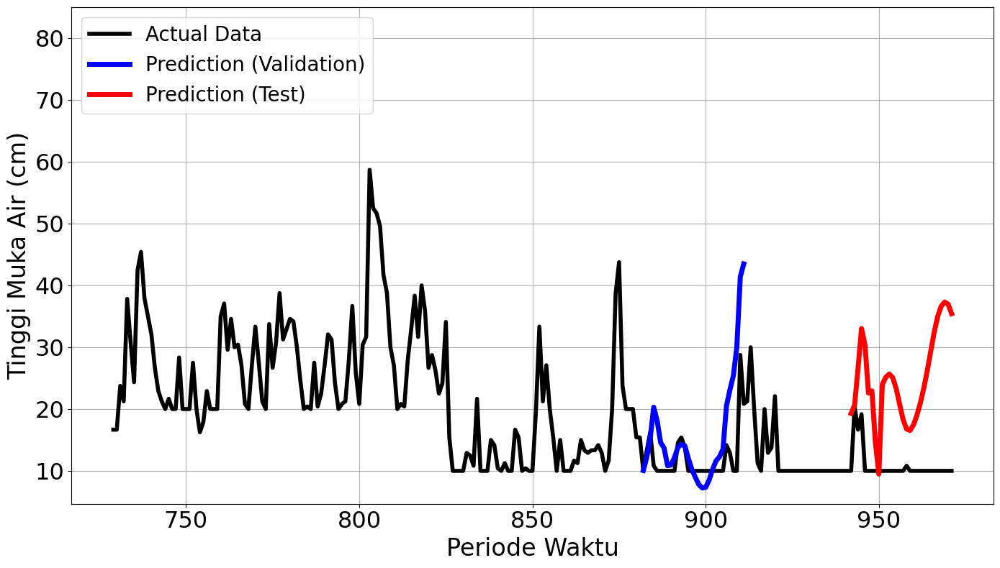

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2712 - val_loss: 0.0343
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step - loss: 0.0454 - val_loss: 0.0132
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0364 - val_loss: 0.0216
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.0427 - val_loss: 0.0241
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step - loss: 0.0304 - val_loss: 0.0291
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 0.0211 - val_loss: 0.0362
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - loss: 0.0184Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - loss: 0.0184 - val_loss: 0.0450
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
mape validation = 28.60353616239999 %
mape test = 48.233296251726614 %


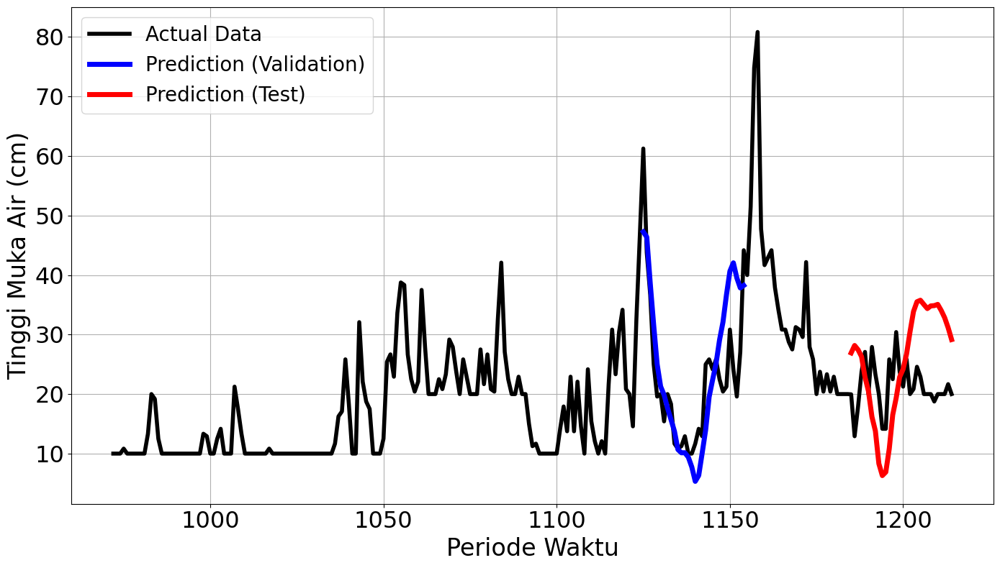

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6134
Final Average MAPE Test: 0.9319
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.5838 - val_loss: 0.1902
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 795ms/step - loss: 0.2446 - val_loss: 0.1256
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.0995 - val_loss: 0.0688
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step - loss: 0.0483 - val_loss: 0.0260
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0344 - val_loss: 0.0238
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - loss: 0.0273 - val_loss: 0.0531
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 0.0227 - val_loss: 0.0872
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - loss: 0.0216 - val_loss: 0.1064
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - loss: 0.0217 - val_loss: 0.1107
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0182Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - loss: 0.0182 - val_loss: 0.1094
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

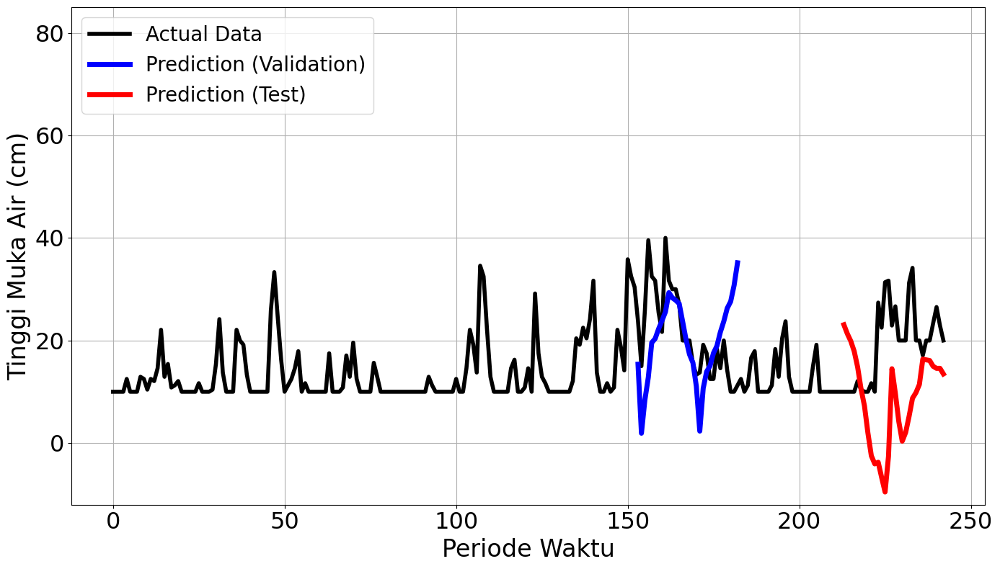

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.3707 - val_loss: 0.4799
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0843 - val_loss: 0.5341
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - loss: 0.0515 - val_loss: 0.4834
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - loss: 0.0736 - val_loss: 0.4183
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - loss: 0.0763 - val_loss: 0.3667
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step - loss: 0.0502 - val_loss: 0.3374
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - loss: 0.0383 - val_loss: 0.3201
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step - loss: 0.0342 - val_loss: 0.3061
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step - loss: 0.0281 - val_loss: 0.2947
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - loss: 0.0359 - val_loss: 0.2826
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step - loss: 0.0315 - val_loss: 0.2702
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0299 - val_loss:

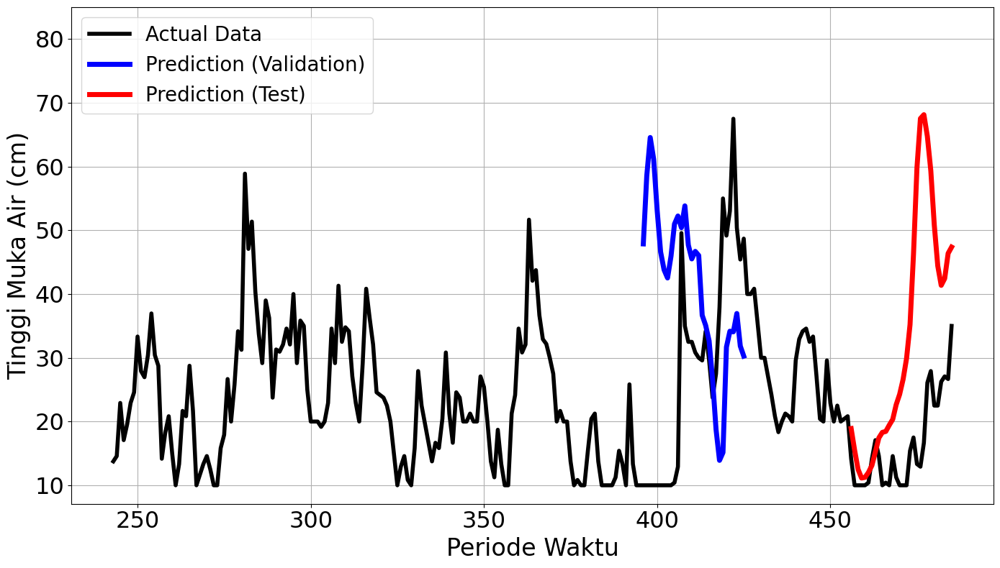

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.4453 - val_loss: 0.0056
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - loss: 0.1960 - val_loss: 0.0049
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - loss: 0.0781 - val_loss: 0.0084
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0326 - val_loss: 0.0063
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - loss: 0.0144 - val_loss: 0.0030
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step - loss: 0.0113 - val_loss: 0.0017
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - loss: 0.0153 - val_loss: 0.0014
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - loss: 0.0175 - val_loss: 0.0015
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.0128 - val_loss: 0.0025
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.0090 - val_loss: 0.0036
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - loss: 0.0094 - val_loss: 0.0033
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0079Restoring mo

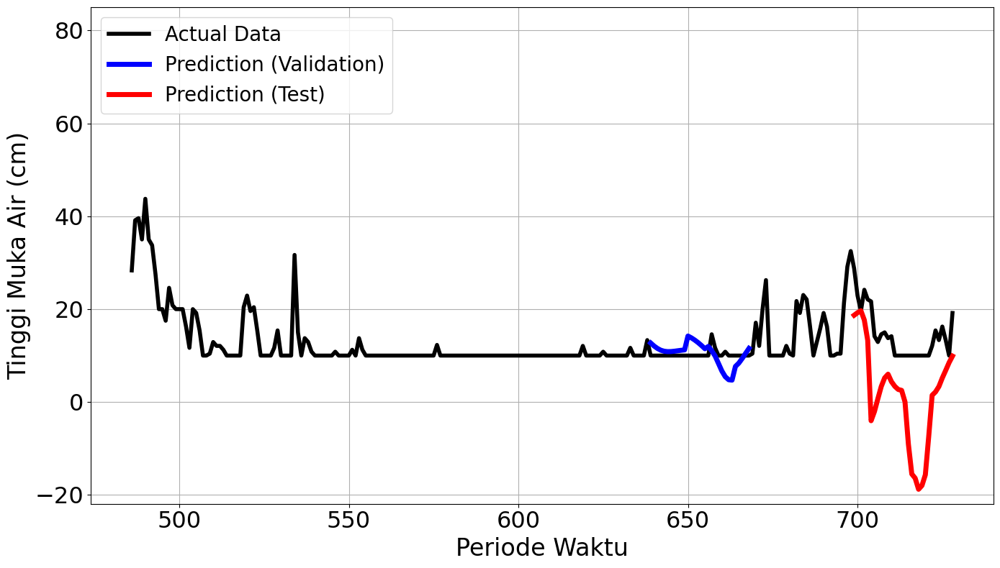

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2826 - val_loss: 0.4934
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 0.1082 - val_loss: 0.2523
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step - loss: 0.1029 - val_loss: 0.1212
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - loss: 0.0731 - val_loss: 0.0757
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step - loss: 0.0449 - val_loss: 0.0533
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0314 - val_loss: 0.0401
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0296 - val_loss: 0.0319
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - loss: 0.0278 - val_loss: 0.0269
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - loss: 0.0298 - val_loss: 0.0243
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step - loss: 0.0364 - val_loss: 0.0236
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - loss: 0.0267 - val_loss: 0.0243
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step - loss: 0.0276 - val_loss:

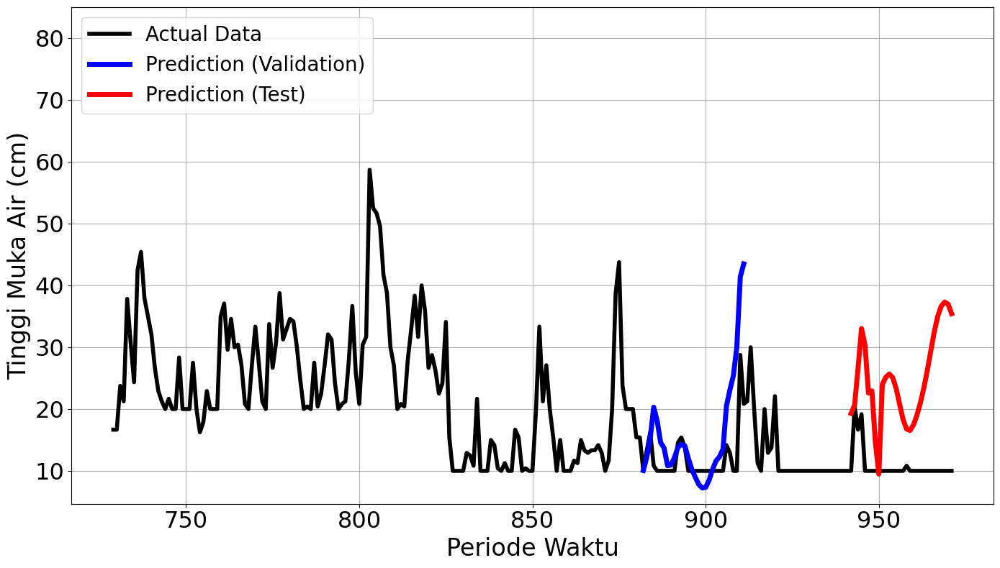

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2712 - val_loss: 0.0343
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - loss: 0.0454 - val_loss: 0.0132
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0364 - val_loss: 0.0216
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0427 - val_loss: 0.0241
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step - loss: 0.0304 - val_loss: 0.0291
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - loss: 0.0211 - val_loss: 0.0362
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - loss: 0.0184Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step - loss: 0.0184 - val_loss: 0.0450
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
mape validation = 28.60353616239999 %
mape test = 48.233296251726614 %


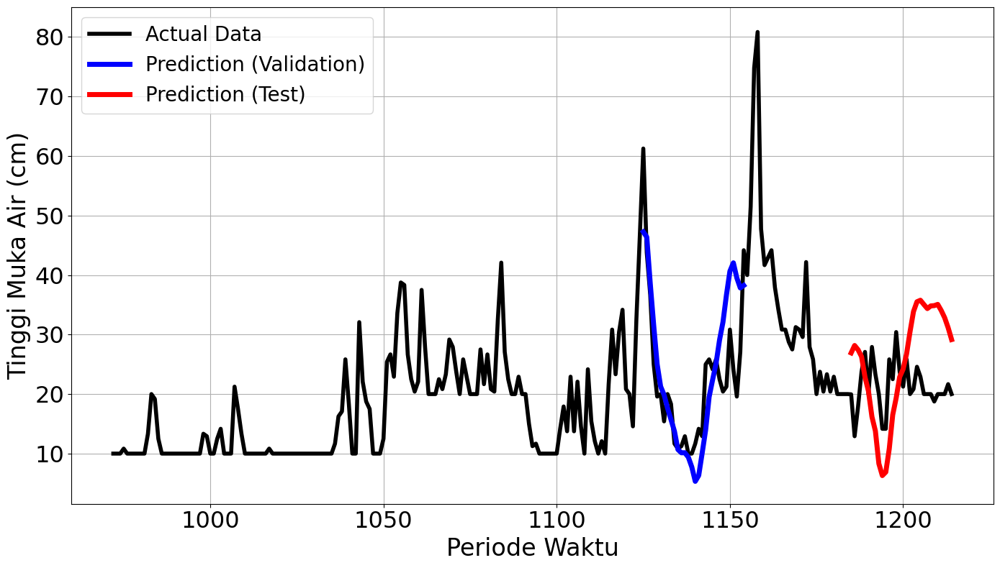

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.6134
Final Average MAPE Test: 0.9319


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - loss: 0.0430 - val_loss: 0.0124
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0089 - val_loss: 0.0958
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0070 - val_loss: 0.0158
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0097 - val_loss: 0.0330
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0067 - val_loss: 0.0225
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0074Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0074 - val_loss: 0.0299
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
mape validation = 32.728181428928785 %
mape test = 35.46699699823455 %


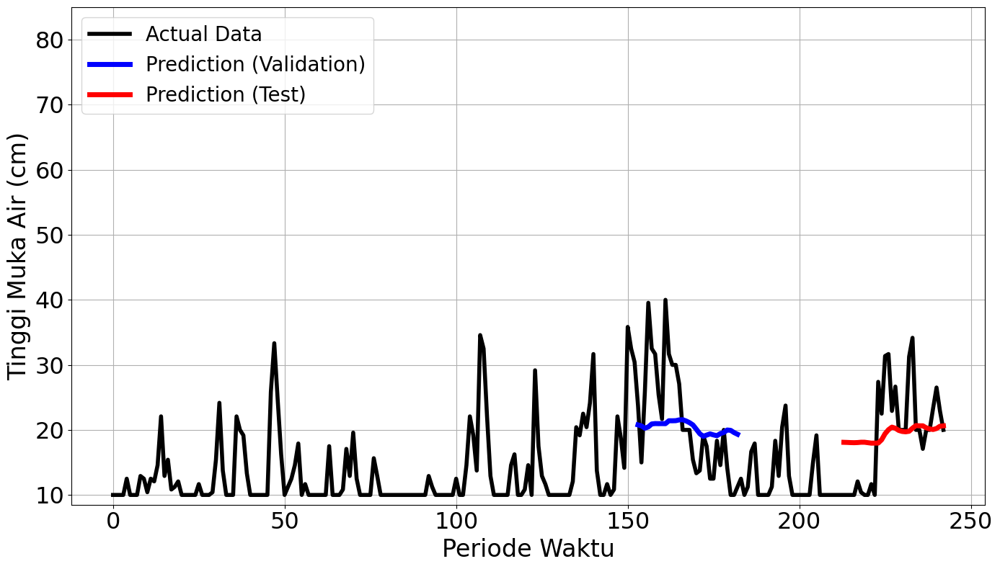

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.1070 - val_loss: 0.0474
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0215 - val_loss: 0.0467
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0266 - val_loss: 0.0195
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0132 - val_loss: 0.0198
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0124 - val_loss: 0.0247
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0075 - val_loss: 0.0222
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0120 - val_loss: 0.0198
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0112Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.0112 - val_loss: 0.0274
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
mape validation = 41.707378271876244 %
mape test = 53.76304073669217 %


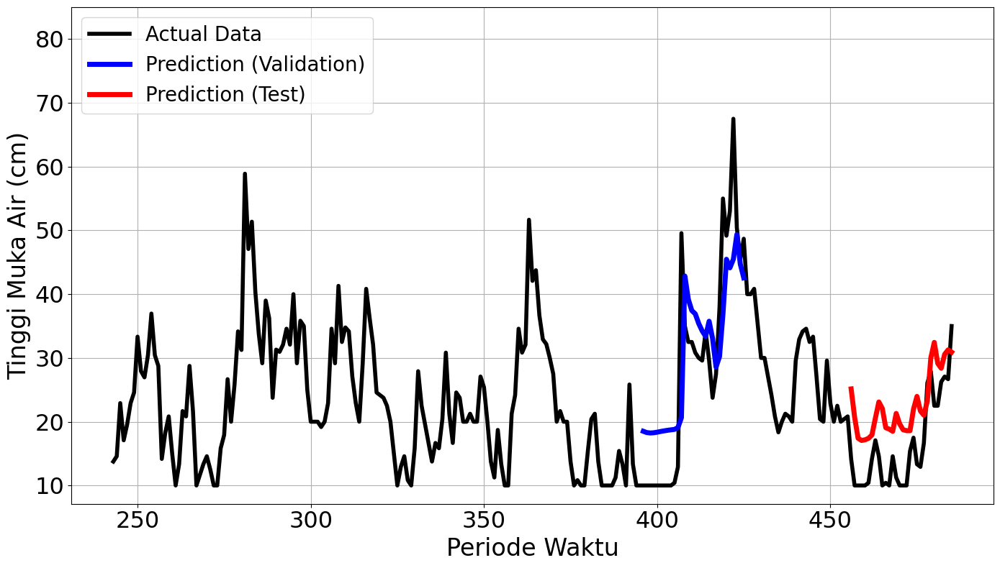

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - loss: 0.0513 - val_loss: 1.6219e-04
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0046 - val_loss: 0.0115
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0150 - val_loss: 0.0010
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0038 - val_loss: 1.5597e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0059 - val_loss: 5.6847e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - loss: 0.0042 - val_loss: 4.0016e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0041Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0041 - val_loss: 3.9883e-04
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
m

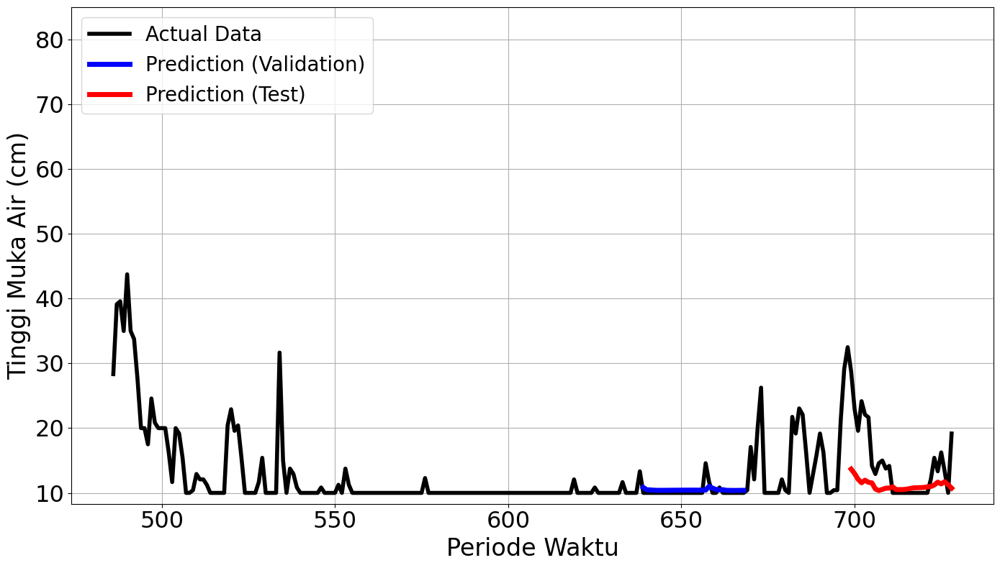

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.1052 - val_loss: 0.0031
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0226 - val_loss: 0.0065
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0197 - val_loss: 0.0065
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.0310 - val_loss: 0.0107
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0118 - val_loss: 0.0147
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0135Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0134 - val_loss: 0.0059
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
mape validation = 15.529595997734107 %
mape test = 30.395219395660877 %


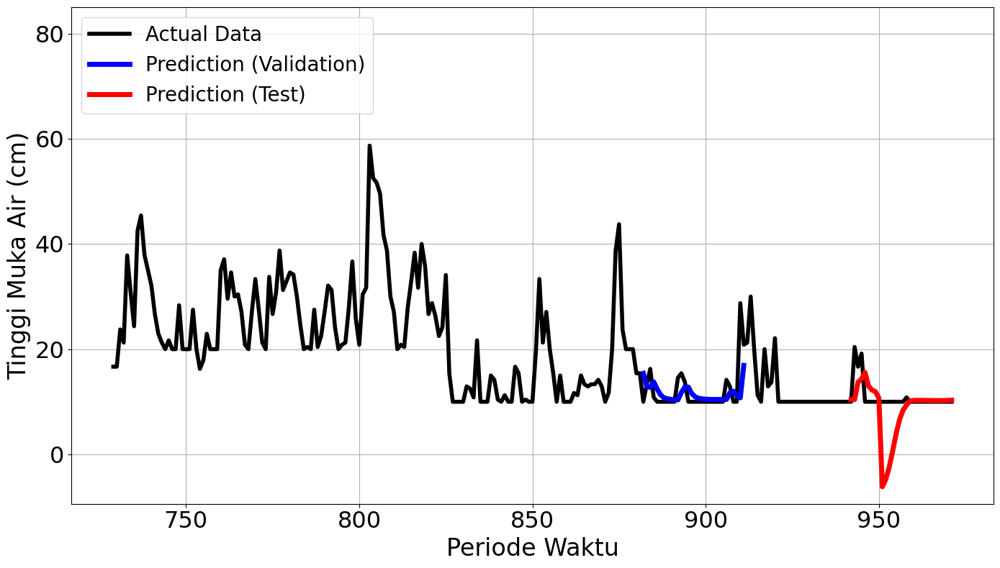

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - loss: 0.0703 - val_loss: 0.0229
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0088 - val_loss: 0.0172
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0100 - val_loss: 0.0193
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0173 - val_loss: 0.0169
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0107 - val_loss: 0.0273
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0120 - val_loss: 0.0228
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0139 - val_loss: 0.0133
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0070 - val_loss: 0.0134
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0078 - val_loss: 0.0146
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0120 - val_loss: 0.0110
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0085 - val_loss: 0.0137
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.

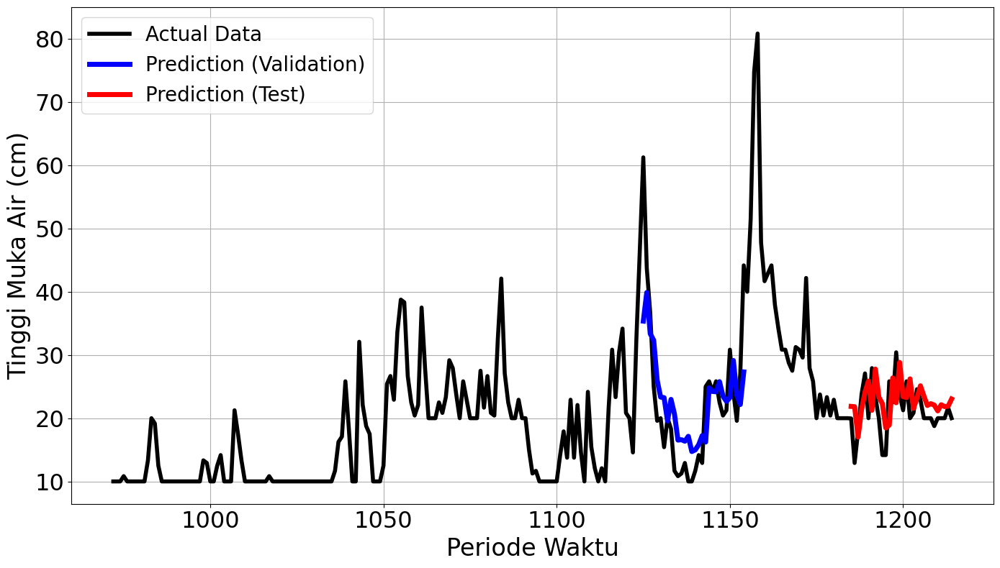

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2450
Final Average MAPE Test: 0.3184
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0430 - val_loss: 0.0124
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0089 - val_loss: 0.0958
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0070 - val_loss: 0.0158
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0097 - val_loss: 0.0330
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0067 - val_loss: 0.0225
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0074Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - loss: 0.0074 - val_loss: 0.0299
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
mape validation = 32.728181428928785 %
mape test = 35.46699699823455 %


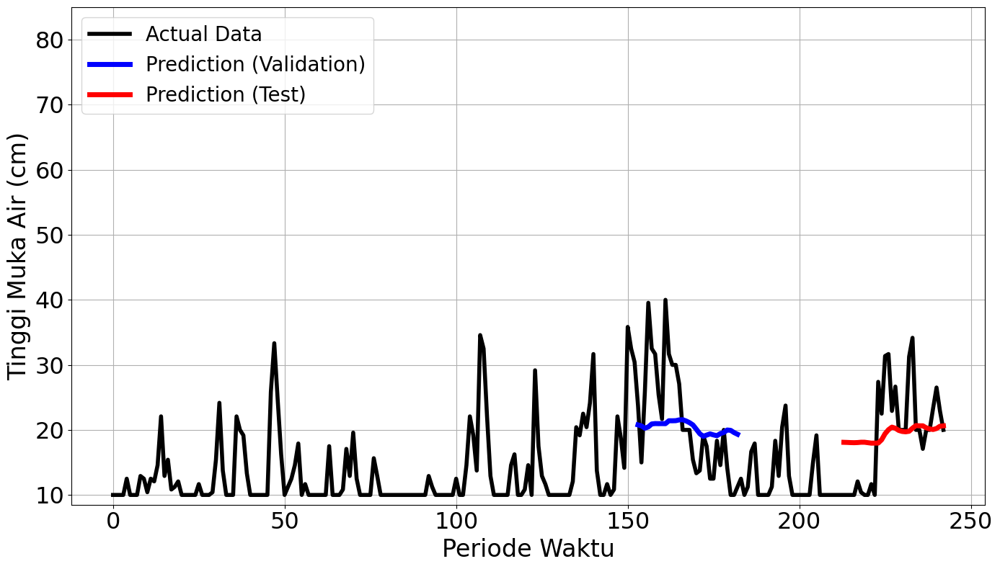

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - loss: 0.1070 - val_loss: 0.0474
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0215 - val_loss: 0.0467
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0266 - val_loss: 0.0195
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0132 - val_loss: 0.0198
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0124 - val_loss: 0.0247
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0075 - val_loss: 0.0222
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0120 - val_loss: 0.0198
Epoch 8/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0111Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0112 - val_loss: 0.0274
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
mape validation = 41.707378271876244 %
mape test = 53.76304073669217 %


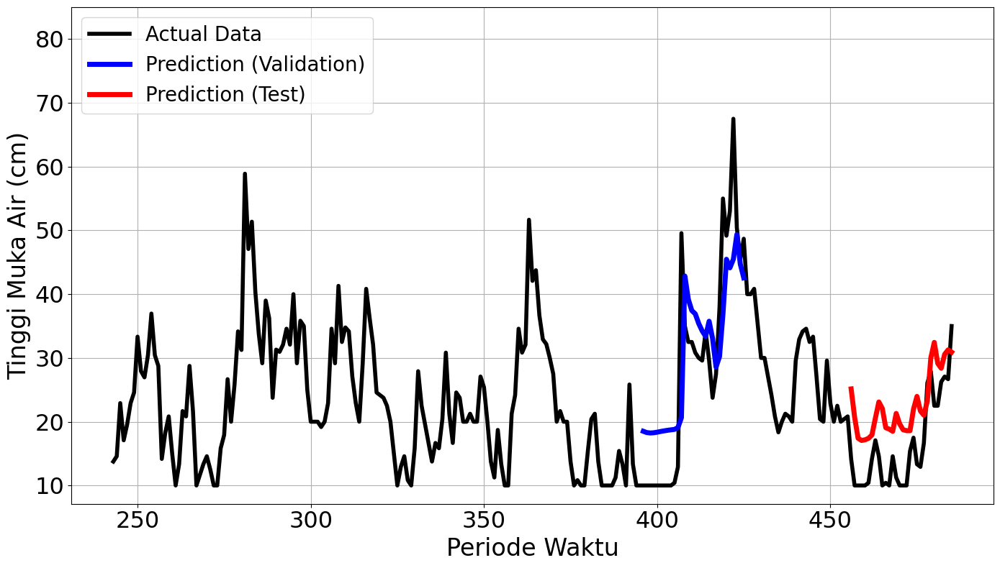

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.0513 - val_loss: 1.6219e-04
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.0046 - val_loss: 0.0115
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0150 - val_loss: 0.0010
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0038 - val_loss: 1.5597e-04
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0059 - val_loss: 5.6847e-04
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0042 - val_loss: 4.0016e-04
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0041Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0041 - val_loss: 3.9883e-04
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

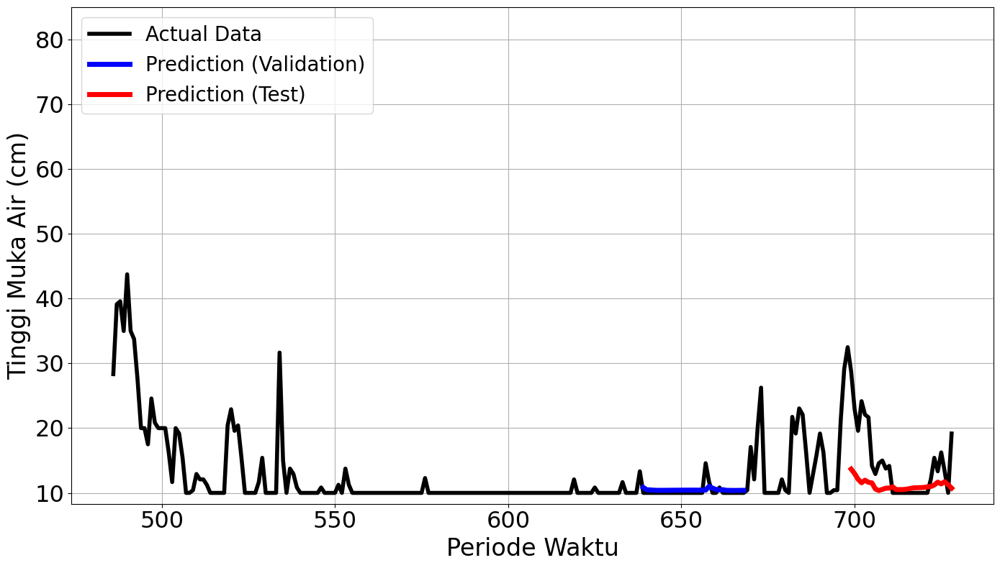

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - loss: 0.1052 - val_loss: 0.0031
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0226 - val_loss: 0.0065
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0197 - val_loss: 0.0065
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0310 - val_loss: 0.0107
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0118 - val_loss: 0.0147
Epoch 6/150
92/93 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0135Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - loss: 0.0134 - val_loss: 0.0059
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
mape validation = 15.529595997734107 %
mape test = 30.395219395660877 %


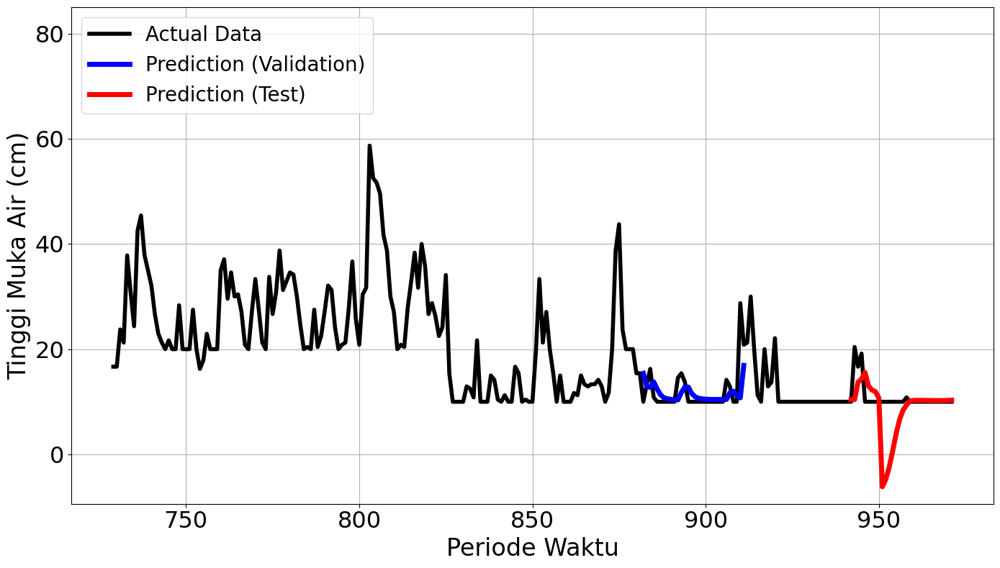

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 0.0703 - val_loss: 0.0229
Epoch 2/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 0.0088 - val_loss: 0.0172
Epoch 3/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0100 - val_loss: 0.0193
Epoch 4/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.0173 - val_loss: 0.0169
Epoch 5/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step - loss: 0.0107 - val_loss: 0.0273
Epoch 6/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0120 - val_loss: 0.0228
Epoch 7/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0139 - val_loss: 0.0133
Epoch 8/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0070 - val_loss: 0.0134
Epoch 9/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - loss: 0.0078 - val_loss: 0.0146
Epoch 10/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0120 - val_loss: 0.0110
Epoch 11/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.0085 - val_loss: 0.0137
Epoch 12/150
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.

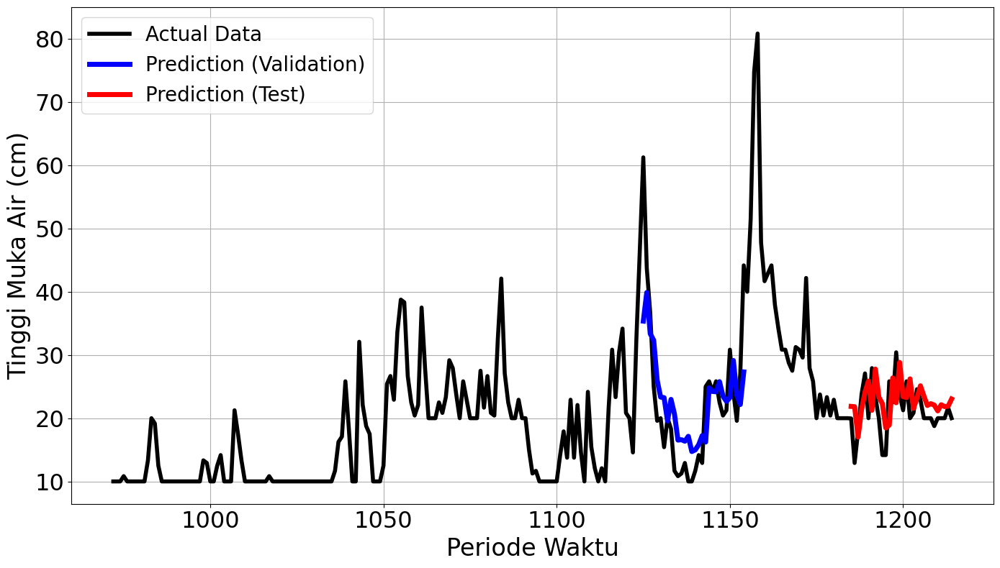

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2450
Final Average MAPE Test: 0.3184
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 219ms/step - loss: 0.2333 - val_loss: 0.0139
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0316 - val_loss: 0.0153
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0279 - val_loss: 0.1169
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0188 - val_loss: 0.0474
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0097 - val_loss: 0.0190
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0067Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0068 - val_loss: 0.0214
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
mape validation = 37.00783870371482 %
mape test = 64.92942772168011 %


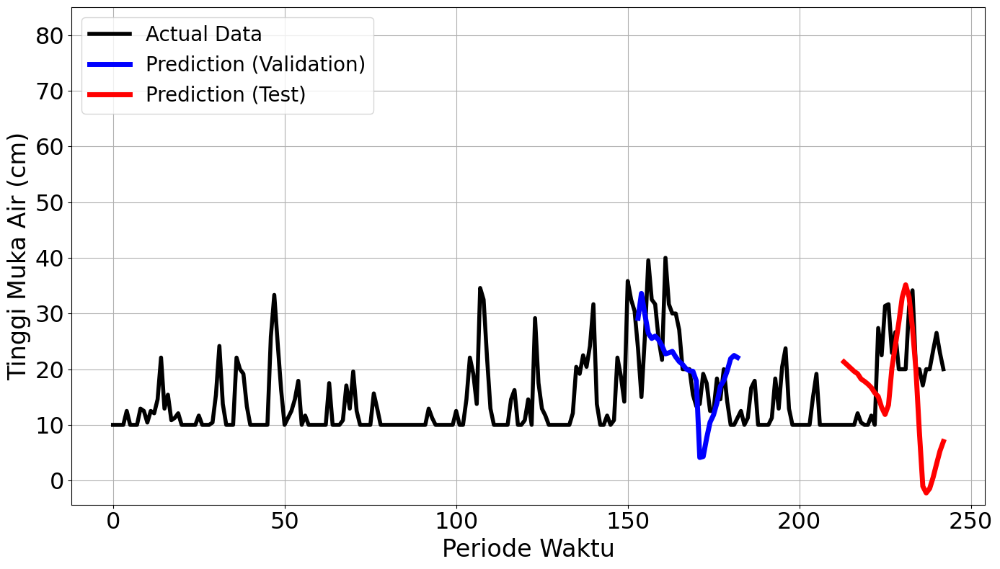

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 207ms/step - loss: 0.3165 - val_loss: 0.1310
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0199 - val_loss: 0.1489
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0372 - val_loss: 0.0980
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0546 - val_loss: 0.0976
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0651 - val_loss: 0.0526
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0207 - val_loss: 0.0308
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0114 - val_loss: 0.0214
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0132 - val_loss: 0.0264
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0120 - val_loss: 0.0209
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0153 - val_loss: 0.0274
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0130 - val_loss: 0.0218
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0120 - val_l

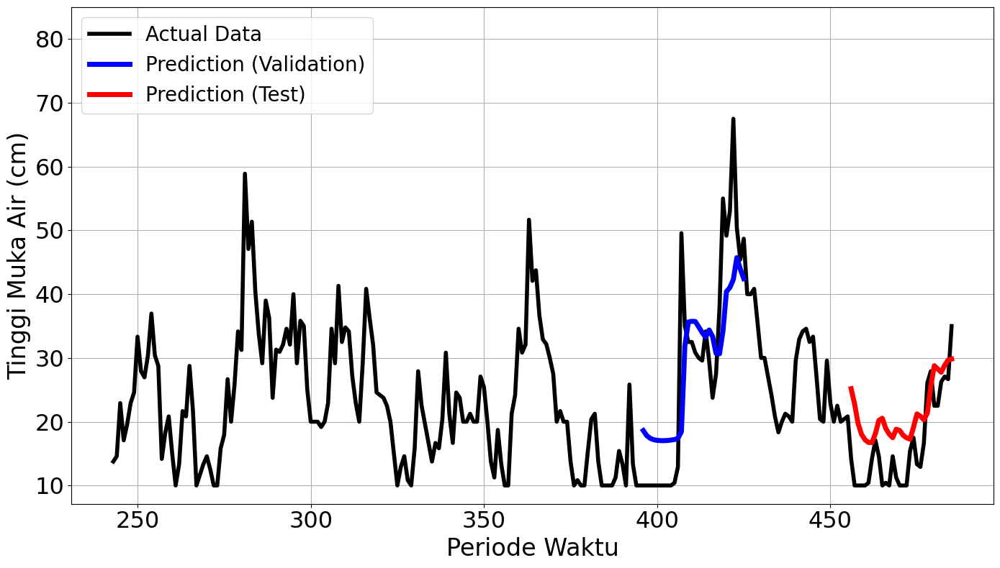

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.1074 - val_loss: 0.0187
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0221 - val_loss: 4.8074e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0077 - val_loss: 0.0040
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0075 - val_loss: 2.2519e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0041 - val_loss: 8.8349e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0049 - val_loss: 6.7191e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0030 - val_loss: 3.0184e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0033 - val_loss: 9.5120e-04
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0030 - val_loss: 4.0492e-04
Epoch 00009: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
m

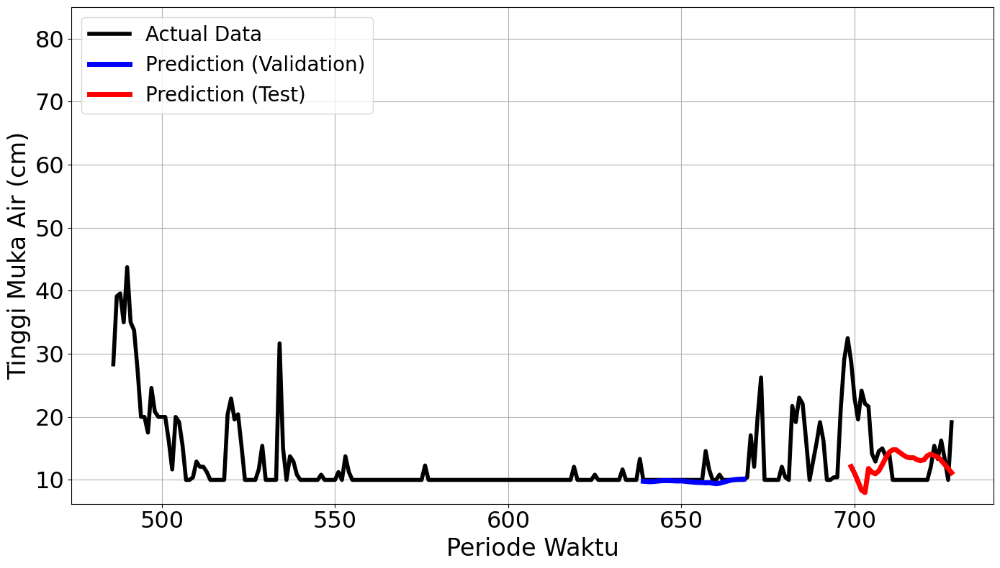

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 227ms/step - loss: 0.3008 - val_loss: 0.0772
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0292 - val_loss: 0.0120
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0275 - val_loss: 0.0115
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0176 - val_loss: 0.0146
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0268 - val_loss: 0.0094
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0193 - val_loss: 0.0190
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0222 - val_loss: 0.0107
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0234 - val_loss: 0.0038
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0155 - val_loss: 0.0180
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0236 - val_loss: 0.0032
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0169 - val_loss: 0.0092
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0144 - val_loss: 0.0039


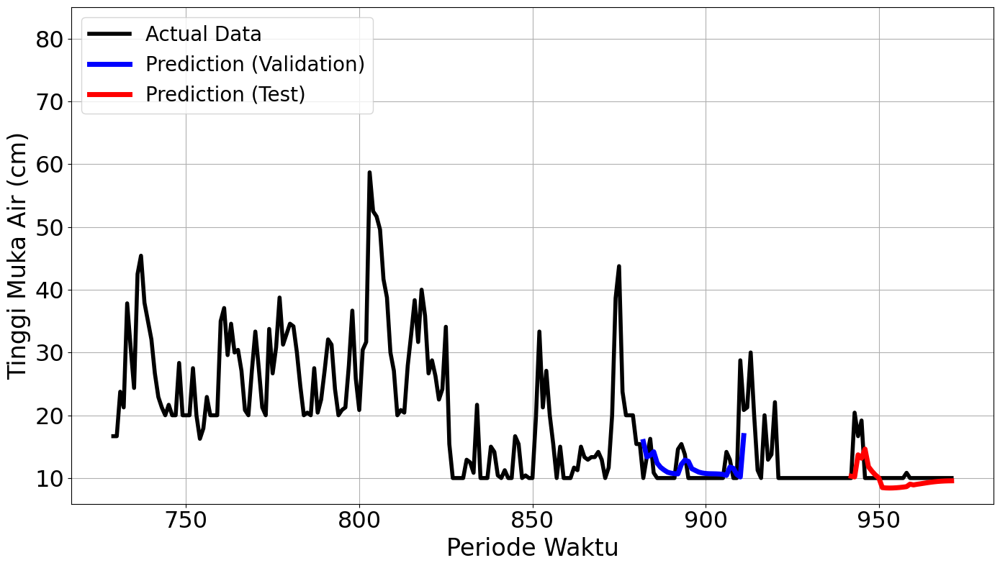

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 202ms/step - loss: 0.3525 - val_loss: 0.1251
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0461 - val_loss: 0.0272
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0457 - val_loss: 0.0343
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0178 - val_loss: 0.0317
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0172 - val_loss: 0.0242
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0253 - val_loss: 0.0247
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0156 - val_loss: 0.0251
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0172 - val_loss: 0.0208
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0155 - val_loss: 0.0223
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0113 - val_loss: 0.0215
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0065 - val_loss: 0.0205
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0071 - val_loss: 0.0209


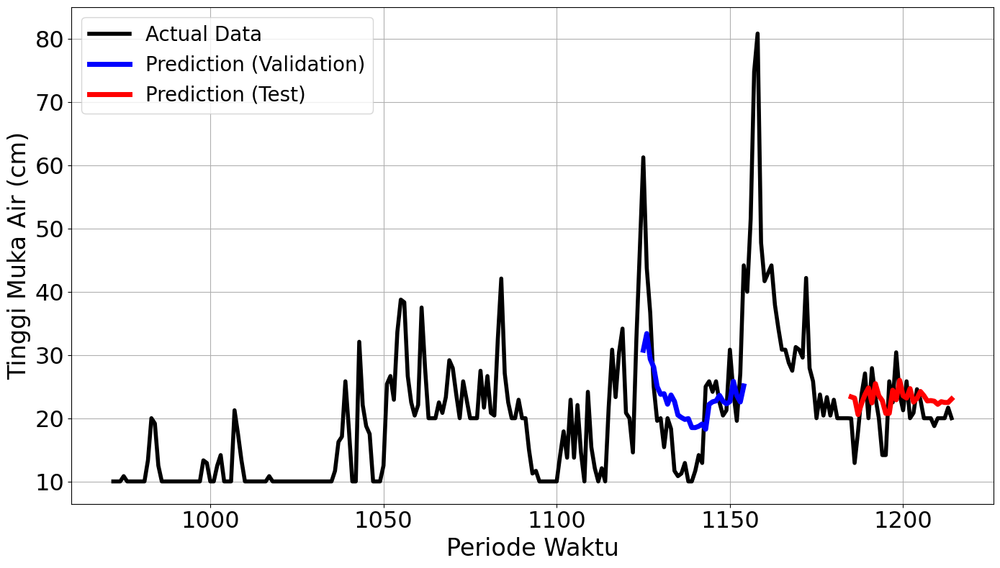

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2627
Final Average MAPE Test: 0.3538
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 216ms/step - loss: 0.2333 - val_loss: 0.0139
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0316 - val_loss: 0.0153
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0279 - val_loss: 0.1169
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0188 - val_loss: 0.0474
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0097 - val_loss: 0.0190
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0067Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0068 - val_loss: 0.0214
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
mape validation = 37.00783870371482 %
mape test = 64.92942772168011 %


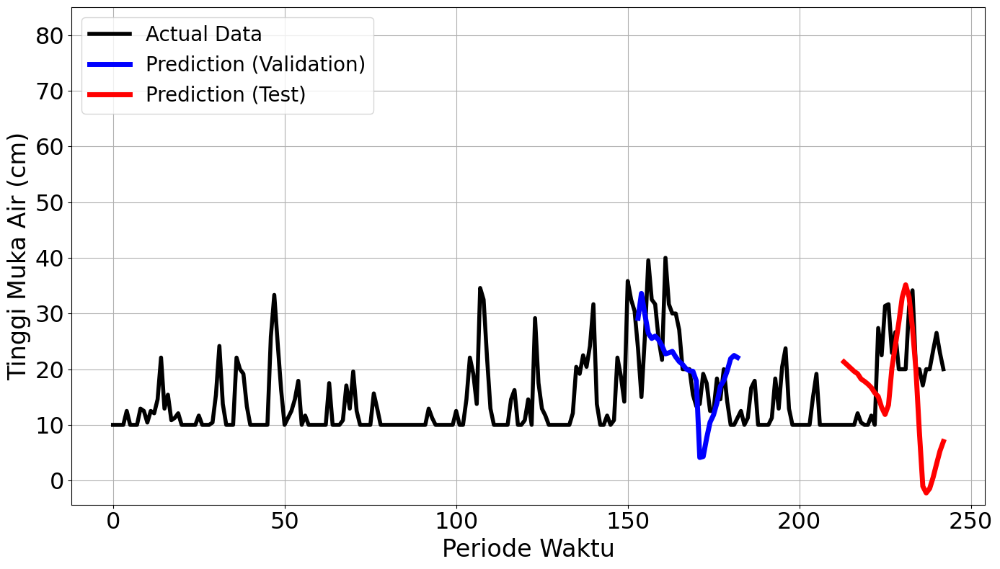

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 221ms/step - loss: 0.3165 - val_loss: 0.1310
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0199 - val_loss: 0.1489
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0372 - val_loss: 0.0980
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0546 - val_loss: 0.0976
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0651 - val_loss: 0.0526
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0207 - val_loss: 0.0308
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0114 - val_loss: 0.0214
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0132 - val_loss: 0.0264
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0120 - val_loss: 0.0209
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0153 - val_loss: 0.0274
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0130 - val_loss: 0.0218
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0120 - val_loss: 0.0224


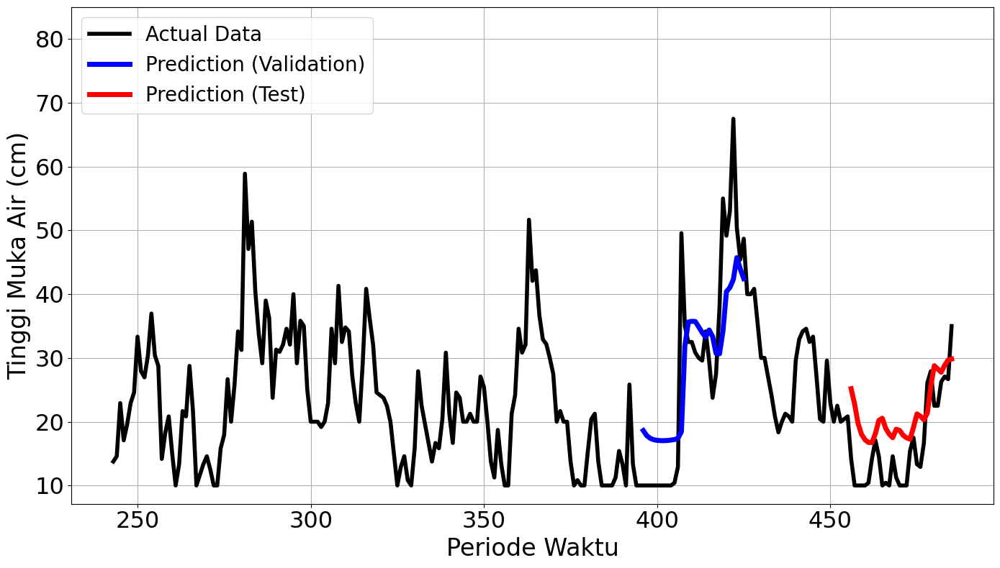

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 216ms/step - loss: 0.1074 - val_loss: 0.0187
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0221 - val_loss: 4.8074e-04
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0077 - val_loss: 0.0040
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0075 - val_loss: 2.2519e-04
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0041 - val_loss: 8.8349e-04
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0049 - val_loss: 6.7191e-04
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0030 - val_loss: 3.0184e-04
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0033 - val_loss: 9.5120e-04
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0032Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0030 - val_loss: 4.0492e-04
Epoch 00009: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 483ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
mape validatio

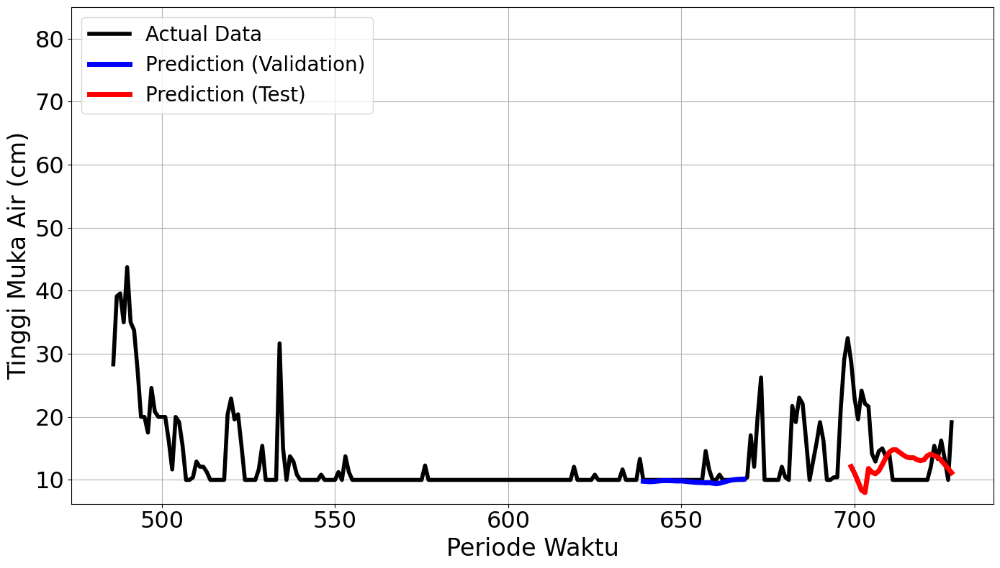

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - loss: 0.3008 - val_loss: 0.0772
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0292 - val_loss: 0.0120
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0275 - val_loss: 0.0115
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0176 - val_loss: 0.0146
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0268 - val_loss: 0.0094
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0193 - val_loss: 0.0190
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0222 - val_loss: 0.0107
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0234 - val_loss: 0.0038
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0155 - val_loss: 0.0180
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0236 - val_loss: 0.0032
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0169 - val_loss: 0.0092
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0144 - val_loss: 0.0039


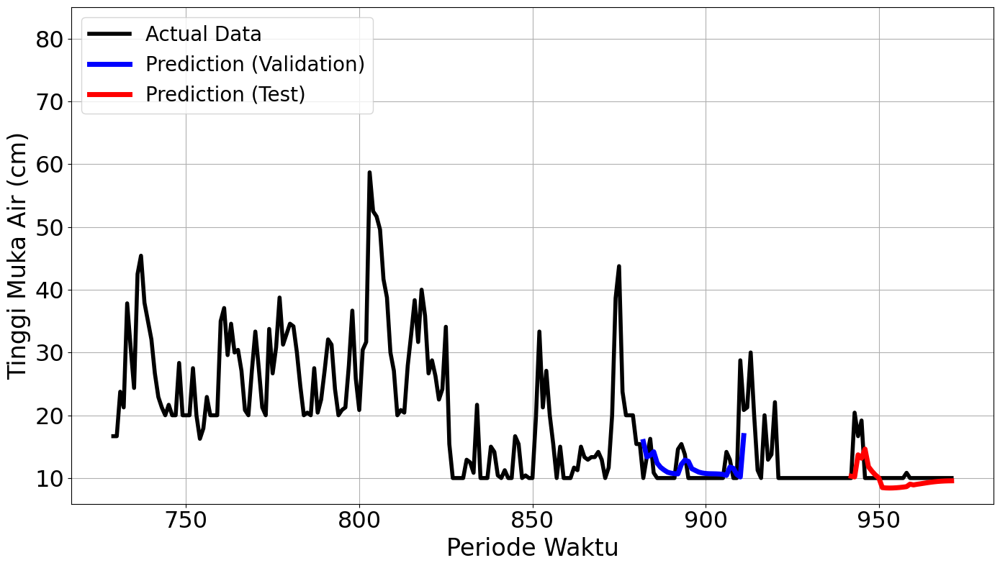

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 218ms/step - loss: 0.3525 - val_loss: 0.1251
Epoch 2/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0461 - val_loss: 0.0272
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0457 - val_loss: 0.0343
Epoch 4/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0178 - val_loss: 0.0317
Epoch 5/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0172 - val_loss: 0.0242
Epoch 6/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0253 - val_loss: 0.0247
Epoch 7/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0156 - val_loss: 0.0251
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0172 - val_loss: 0.0208
Epoch 9/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0155 - val_loss: 0.0223
Epoch 10/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0113 - val_loss: 0.0215
Epoch 11/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0065 - val_loss: 0.0205
Epoch 12/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0071 - val_loss: 0.0209


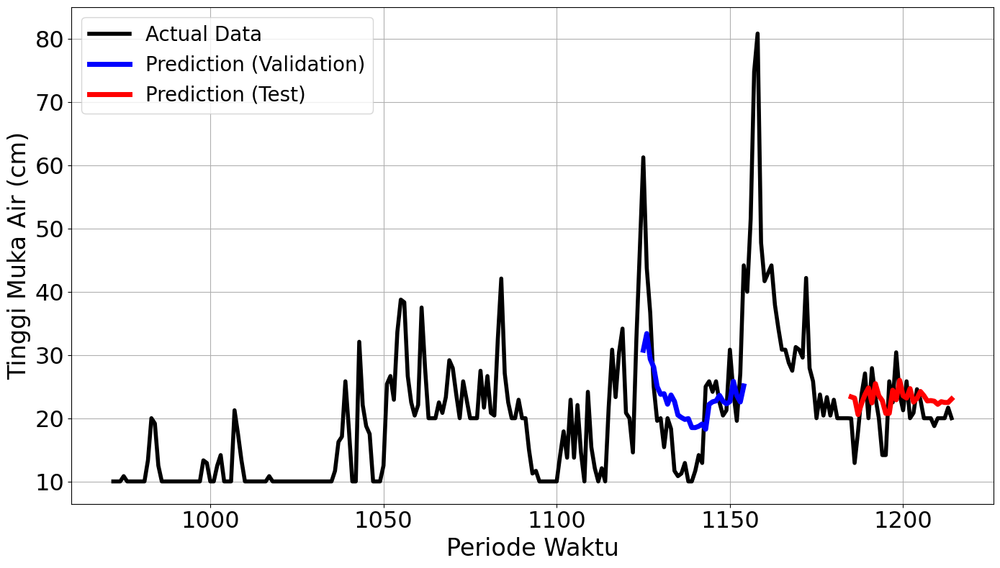

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2627
Final Average MAPE Test: 0.3538
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.6135 - val_loss: 0.1057
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0527 - val_loss: 0.4912
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0756 - val_loss: 0.0940
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0350 - val_loss: 0.0308
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0398 - val_loss: 0.0756
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.0107 - val_loss: 0.1755
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0264 - val_loss: 0.1309
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0156 - val_loss: 0.0467
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0188 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0210 - val_loss: 0.0380
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
mape validation = 55.20444911520263 

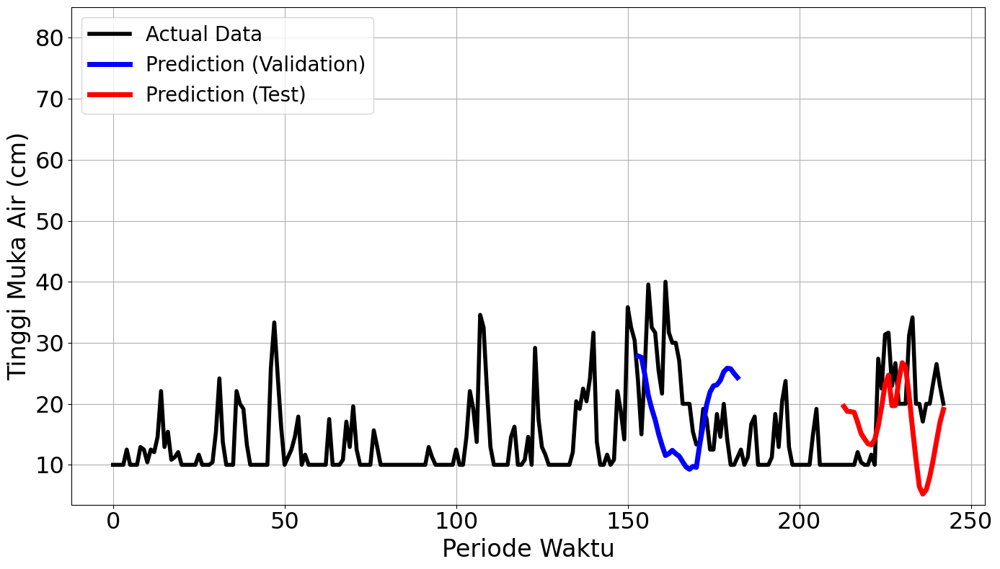

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 973ms/step - loss: 0.2350 - val_loss: 0.4115
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 0.2426 - val_loss: 0.3078
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - loss: 0.0549 - val_loss: 0.2490
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.0850 - val_loss: 0.0856
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - loss: 0.0160 - val_loss: 0.0449
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - loss: 0.0156 - val_loss: 0.0355
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0168 - val_loss: 0.0401
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.0117 - val_loss: 0.0328
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0174 - val_loss: 0.0343
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0145 - val_loss: 0.0310
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0127 - val_loss: 0.0293
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0110 - val_lo

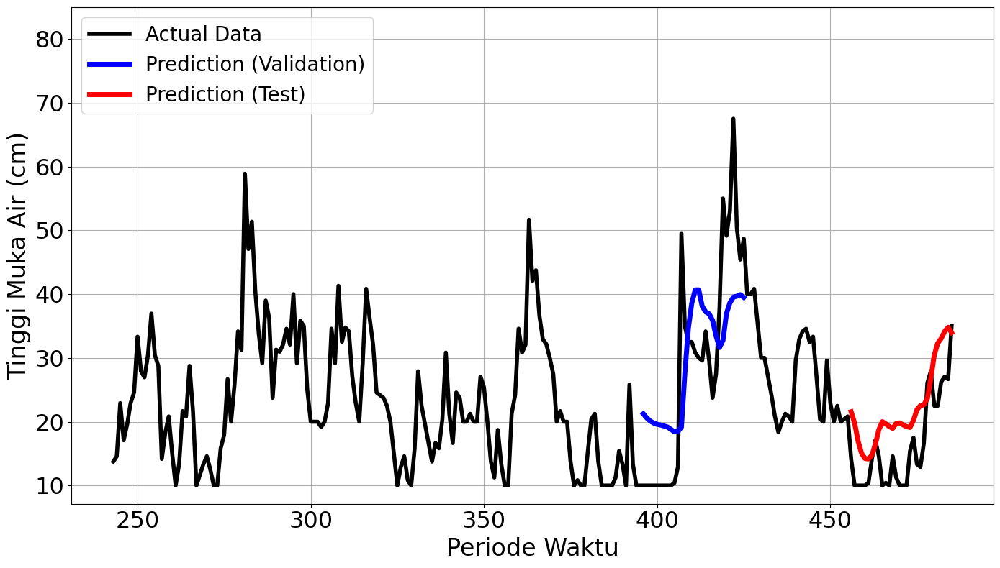

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 892ms/step - loss: 0.5119 - val_loss: 0.1575
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.1126 - val_loss: 0.0753
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0524 - val_loss: 0.0017
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - loss: 0.0267 - val_loss: 0.0126
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.0157 - val_loss: 0.0068
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step - loss: 0.0129 - val_loss: 0.0149
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.0137 - val_loss: 2.6883e-04
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step - loss: 0.0044 - val_loss: 0.0089
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - loss: 0.0114 - val_loss: 0.0036
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.0057 - val_loss: 0.0019
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - loss: 0.0064 - val_loss: 0.0048
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0063 Resto

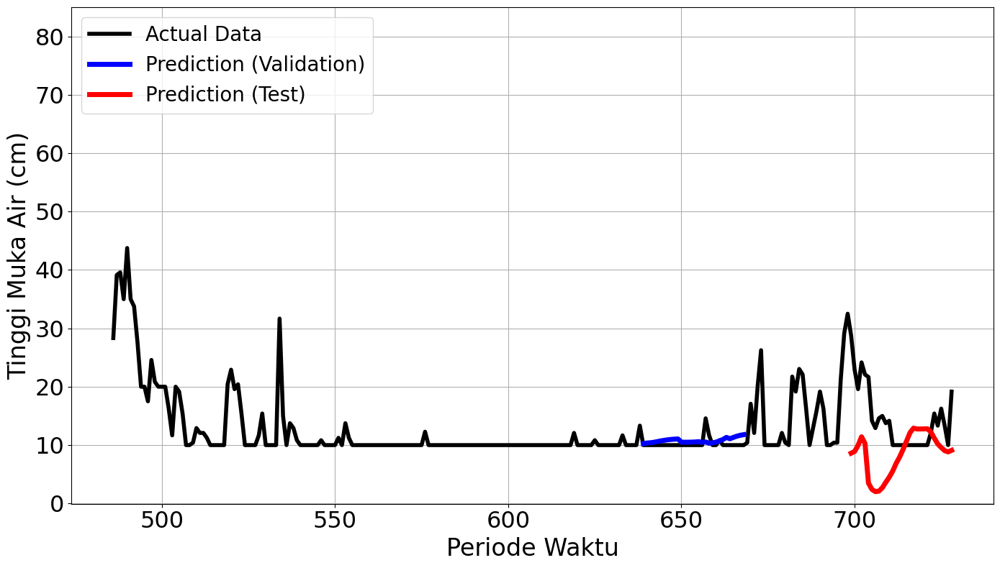

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 872ms/step - loss: 0.2605 - val_loss: 0.1307
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.2152 - val_loss: 0.1914
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.1451 - val_loss: 0.0809
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.1176 - val_loss: 0.0233
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0409 - val_loss: 0.0220
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0499 - val_loss: 0.0149
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0341 - val_loss: 0.0196
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0226 - val_loss: 0.0310
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 0.0337 - val_loss: 0.0112
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.0187 - val_loss: 0.0069
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0167 - val_loss: 0.0115
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 269ms/step - loss: 0.0220 - val_lo

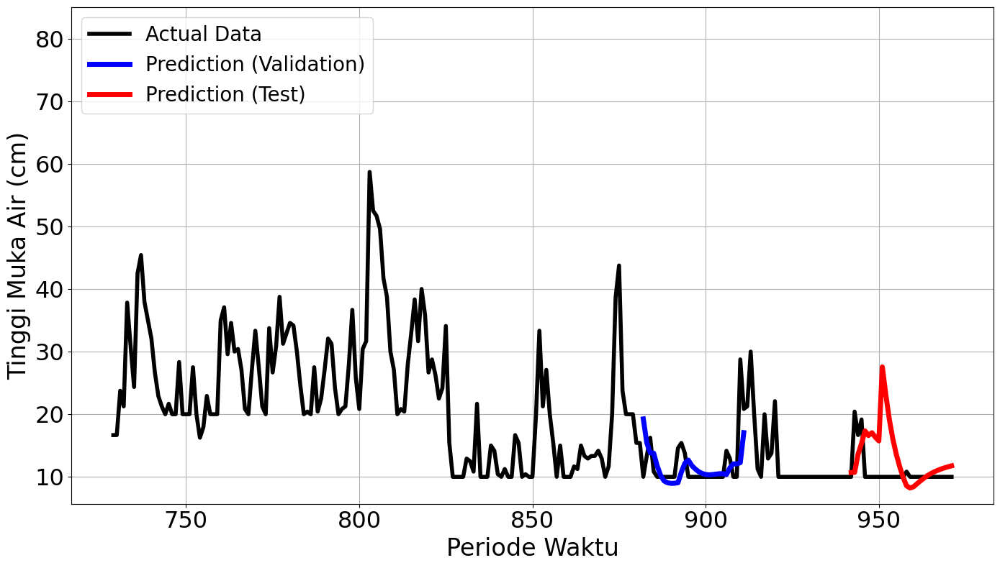

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.2835 - val_loss: 0.2165
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 0.0372 - val_loss: 0.1033
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - loss: 0.1130 - val_loss: 0.1676
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0795 - val_loss: 0.0379
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0210 - val_loss: 0.0387
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 0.0205 - val_loss: 0.0357
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0141 - val_loss: 0.0373
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.0134 - val_loss: 0.0322
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0120 - val_loss: 0.0302
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0105 - val_loss: 0.0312
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0109 - val_loss: 0.0311
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0092 - val_loss:

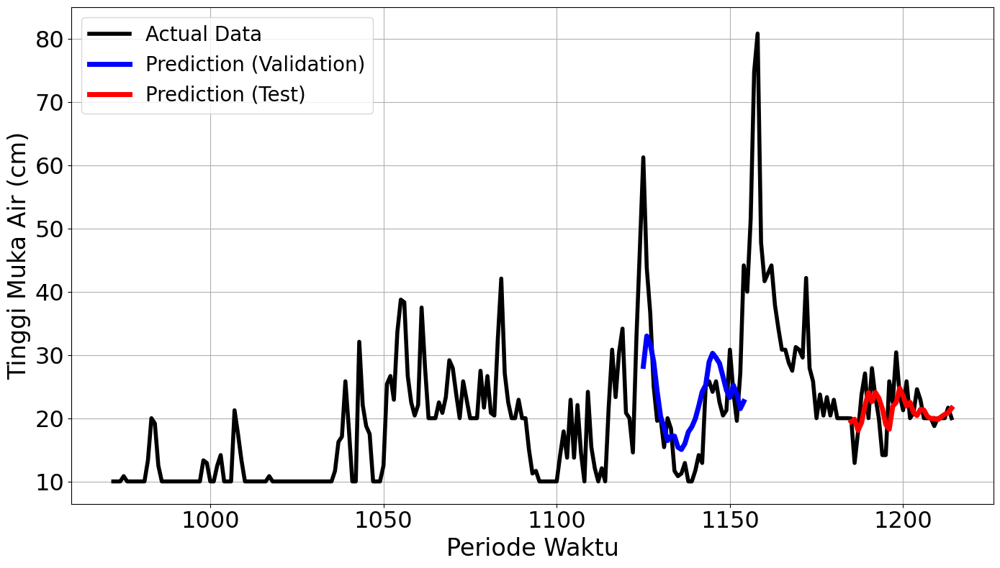

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3274
Final Average MAPE Test: 0.3720
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 934ms/step - loss: 0.6135 - val_loss: 0.1057
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - loss: 0.0527 - val_loss: 0.4912
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0756 - val_loss: 0.0940
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0350 - val_loss: 0.0308
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.0398 - val_loss: 0.0756
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0107 - val_loss: 0.1755
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0264 - val_loss: 0.1309
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0156 - val_loss: 0.0467
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0188 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - loss: 0.0210 - val_loss: 0.0380
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
mape validation = 55.20444911520

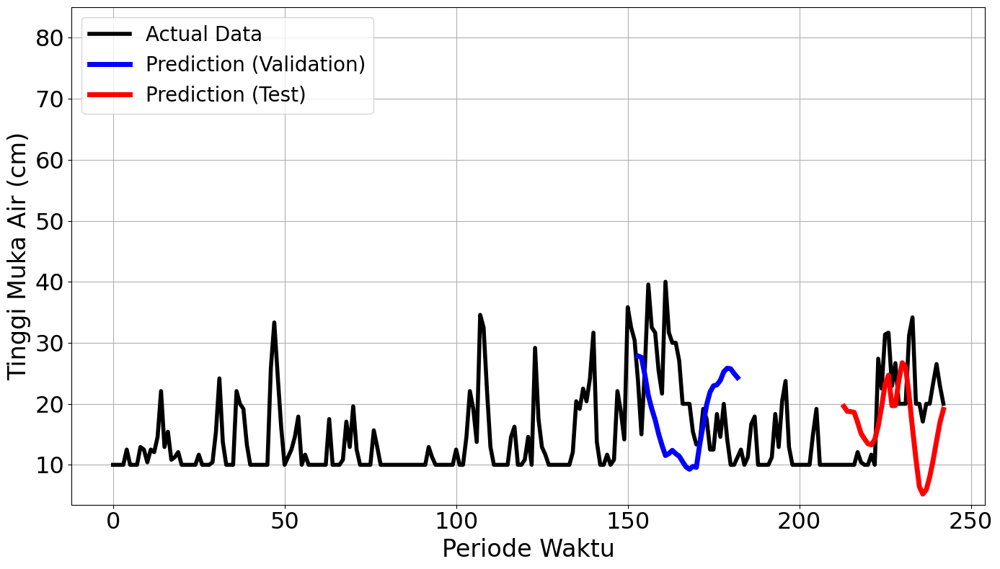

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 871ms/step - loss: 0.2350 - val_loss: 0.4115
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.2426 - val_loss: 0.3078
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0549 - val_loss: 0.2490
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0850 - val_loss: 0.0856
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0160 - val_loss: 0.0449
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0156 - val_loss: 0.0355
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0168 - val_loss: 0.0401
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.0117 - val_loss: 0.0328
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0174 - val_loss: 0.0343
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - loss: 0.0145 - val_loss: 0.0310
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0127 - val_loss: 0.0293
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0110 - val_lo

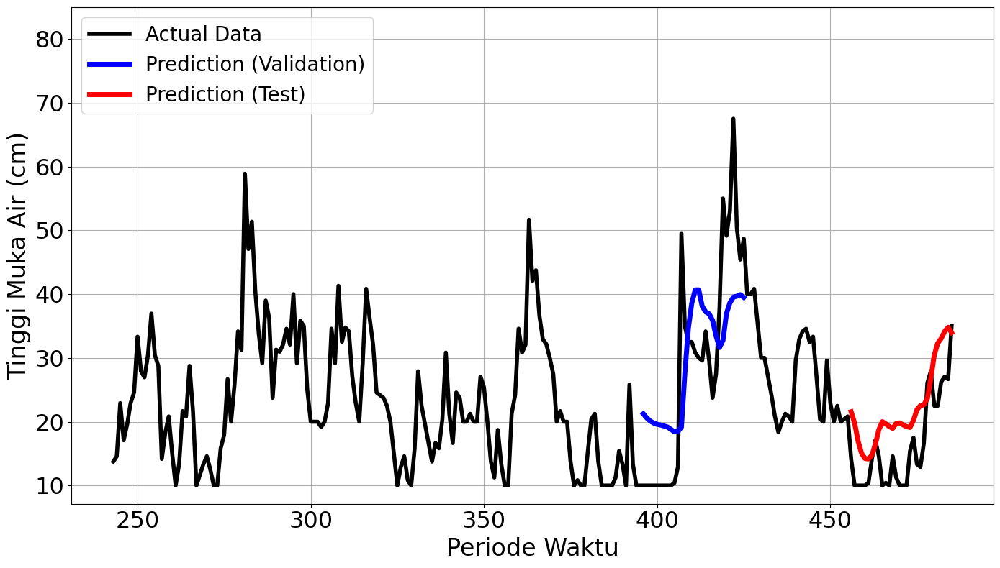

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.5119 - val_loss: 0.1575
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1126 - val_loss: 0.0753
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0524 - val_loss: 0.0017
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0267 - val_loss: 0.0126
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0157 - val_loss: 0.0068
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0129 - val_loss: 0.0149
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0137 - val_loss: 2.6883e-04
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0044 - val_loss: 0.0089
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0114 - val_loss: 0.0036
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0057 - val_loss: 0.0019
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0064 - val_loss: 0.0048
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0063 Restorin

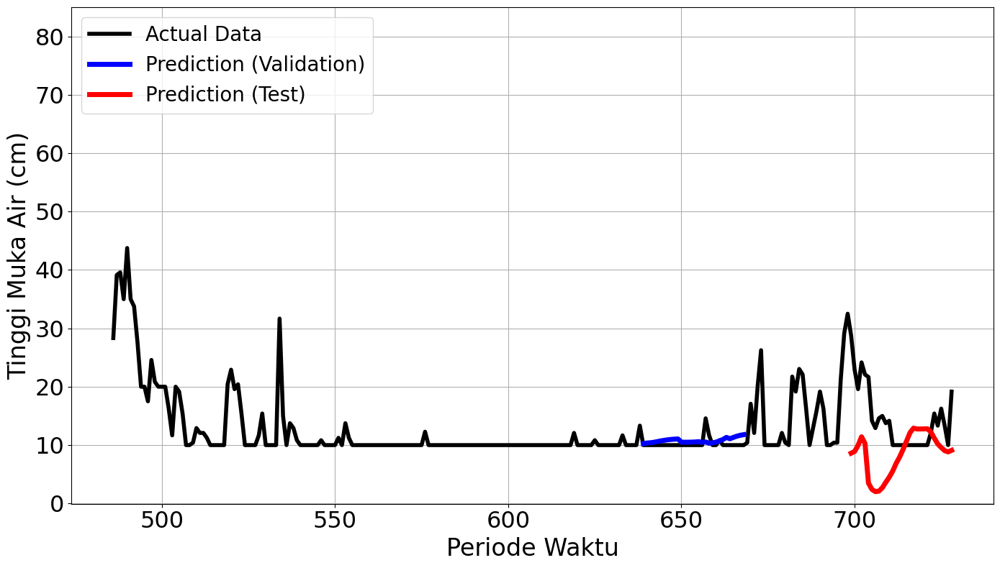

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.2605 - val_loss: 0.1307
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.2152 - val_loss: 0.1914
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step - loss: 0.1451 - val_loss: 0.0809
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - loss: 0.1176 - val_loss: 0.0233
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 178ms/step - loss: 0.0409 - val_loss: 0.0220
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - loss: 0.0499 - val_loss: 0.0149
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0341 - val_loss: 0.0196
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0226 - val_loss: 0.0310
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0337 - val_loss: 0.0112
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0187 - val_loss: 0.0069
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0167 - val_loss: 0.0115
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0220 - val_loss:

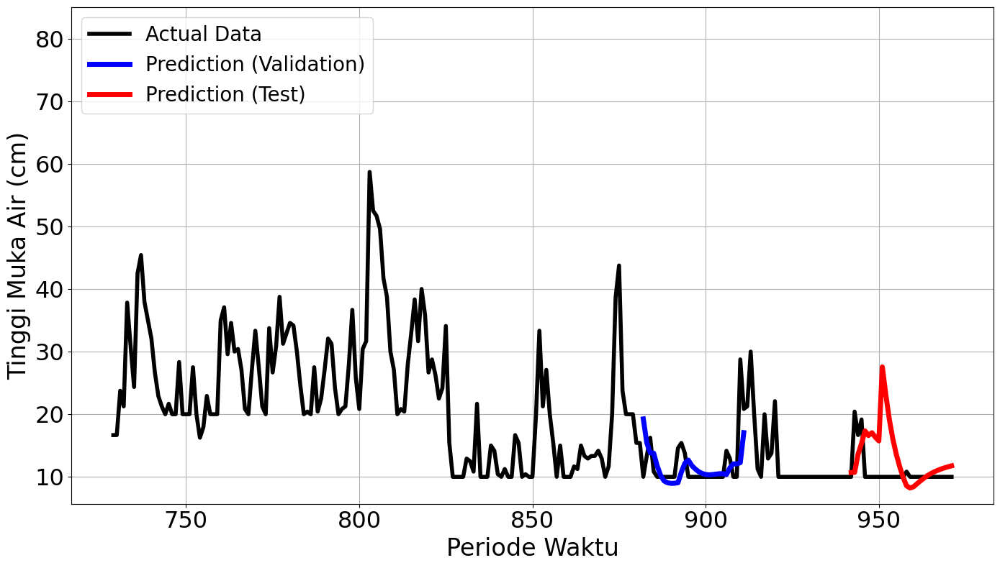

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.2835 - val_loss: 0.2165
Epoch 2/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0372 - val_loss: 0.1033
Epoch 3/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.1130 - val_loss: 0.1676
Epoch 4/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0795 - val_loss: 0.0379
Epoch 5/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0210 - val_loss: 0.0387
Epoch 6/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0205 - val_loss: 0.0357
Epoch 7/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0141 - val_loss: 0.0373
Epoch 8/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0134 - val_loss: 0.0322
Epoch 9/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0120 - val_loss: 0.0302
Epoch 10/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0105 - val_loss: 0.0312
Epoch 11/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0109 - val_loss: 0.0311
Epoch 12/150
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - loss: 0.0092 - val_loss:

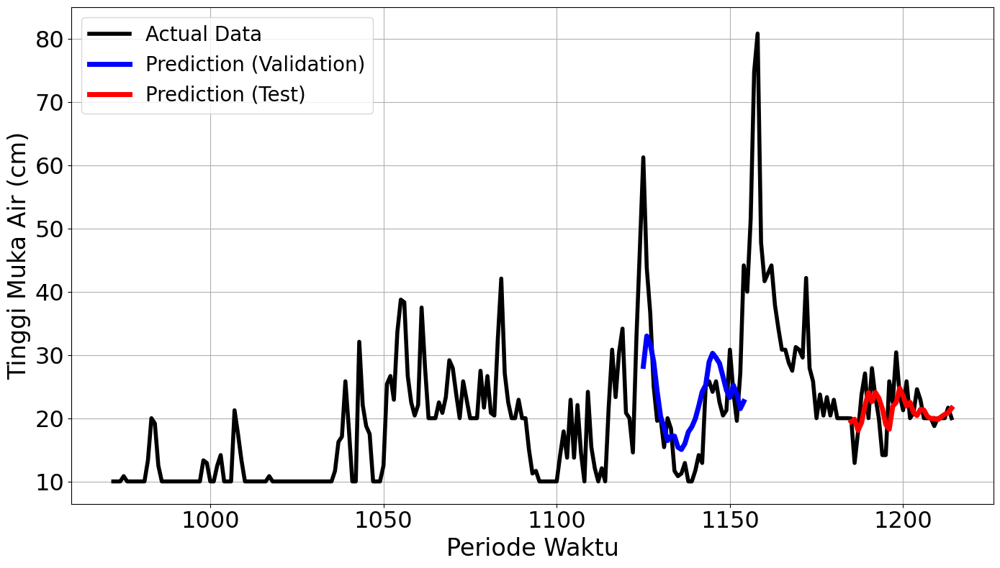

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3274
Final Average MAPE Test: 0.3720
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.5838 - val_loss: 0.1007
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step - loss: 0.0349 - val_loss: 0.1040
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 0.0278 - val_loss: 0.2628
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.0330 - val_loss: 0.1497
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.0099 - val_loss: 0.1011
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - loss: 0.0186Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step - loss: 0.0186 - val_loss: 0.1400
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
mape validation = 91.84232092404999 %
mape test = 95.35967914962042 %


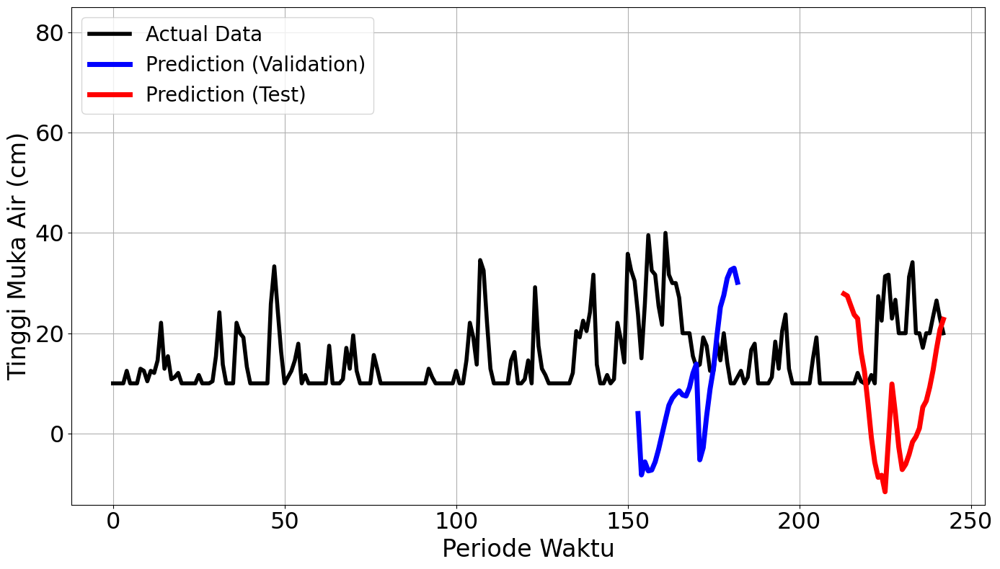

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.3707 - val_loss: 0.4397
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step - loss: 0.6991 - val_loss: 0.0885
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - loss: 0.0940 - val_loss: 0.1099
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0284 - val_loss: 0.1762
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - loss: 0.0777 - val_loss: 0.1184
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - loss: 0.0470 - val_loss: 0.0572
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.0229 - val_loss: 0.0443
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0267 - val_loss: 0.0623
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0345 - val_loss: 0.0457
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.0266 - val_loss: 0.0341
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - loss: 0.0184 - val_loss: 0.0337
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step - loss: 0.0209 - val_loss:

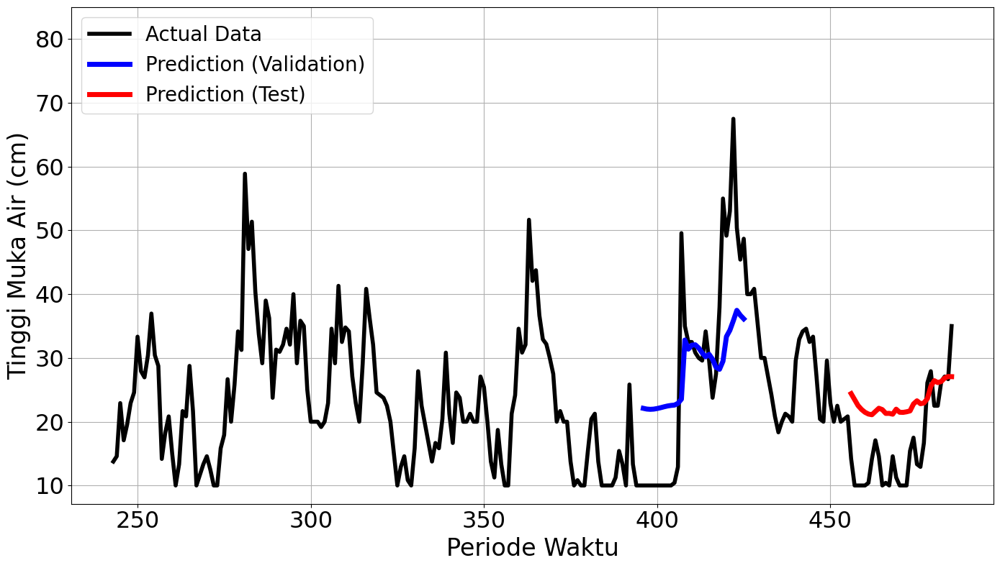

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.4453 - val_loss: 0.0082
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - loss: 0.0140 - val_loss: 0.0806
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - loss: 0.0909 - val_loss: 0.0941
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step - loss: 0.0799 - val_loss: 0.0512
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step - loss: 0.0441 - val_loss: 0.0016
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0053 - val_loss: 0.0205
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0377 - val_loss: 0.0166
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0333 - val_loss: 0.0040
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - loss: 0.0116 - val_loss: 0.0240
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0202Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - loss: 0.0202 - val_loss: 0.0273
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

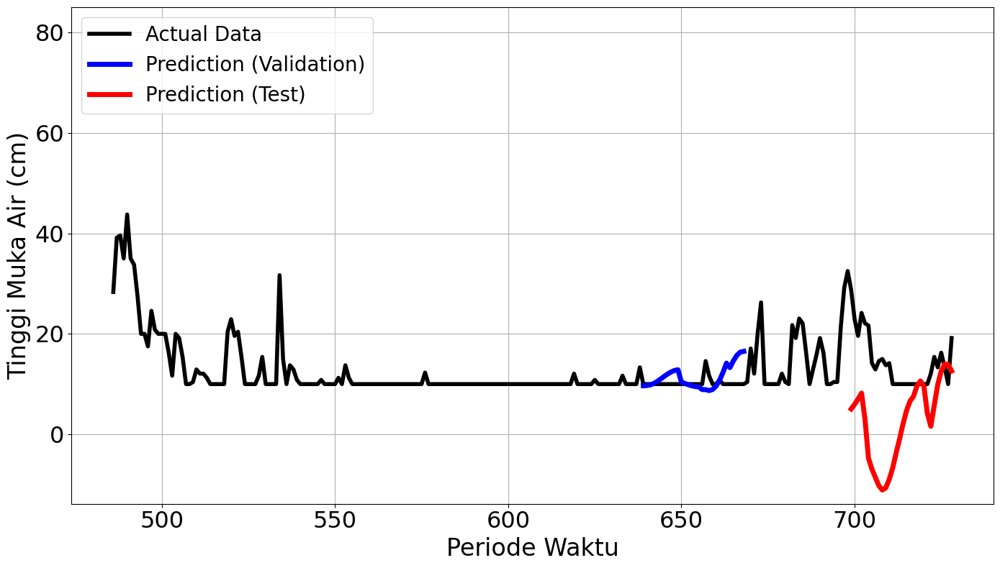

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2826 - val_loss: 0.2169
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.7605 - val_loss: 0.2156
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - loss: 0.6086 - val_loss: 0.1350
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.1208 - val_loss: 0.0777
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step - loss: 0.1008 - val_loss: 0.0168
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 644ms/step - loss: 0.0250 - val_loss: 0.0225
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step - loss: 0.0420 - val_loss: 0.0251
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step - loss: 0.0393 - val_loss: 0.0184
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step - loss: 0.0187 - val_loss: 0.0225
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0177Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - loss: 0.0177 - val_loss: 0.0312
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s

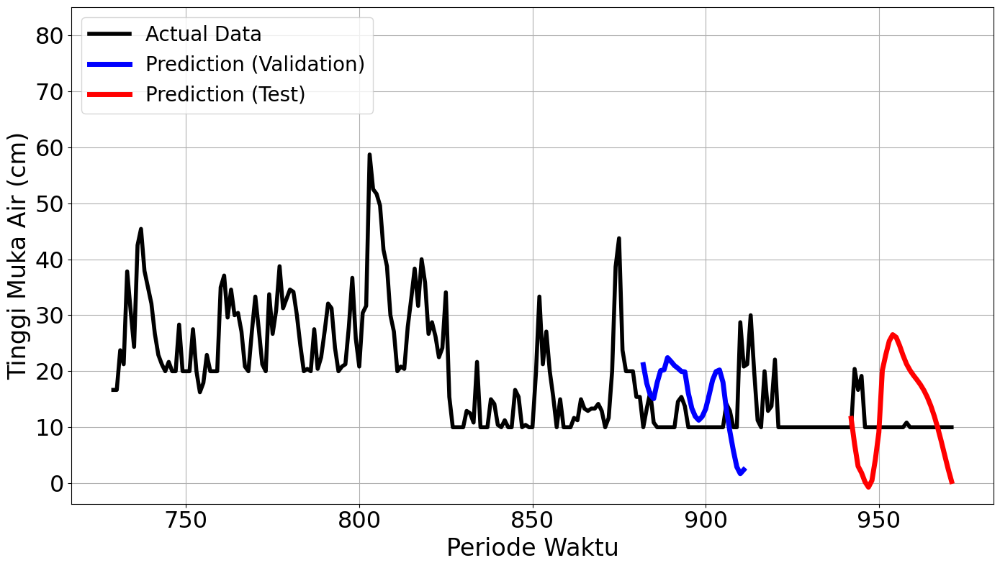

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2712 - val_loss: 0.2197
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.1625 - val_loss: 0.0187
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.0782 - val_loss: 0.0666
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - loss: 0.0410 - val_loss: 0.0832
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step - loss: 0.0485 - val_loss: 0.0614
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - loss: 0.0520 - val_loss: 0.0390
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - loss: 0.0229Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - loss: 0.0229 - val_loss: 0.0279
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
mape validation = 40.92314700085697 %
mape test = 15.76078156661259 %


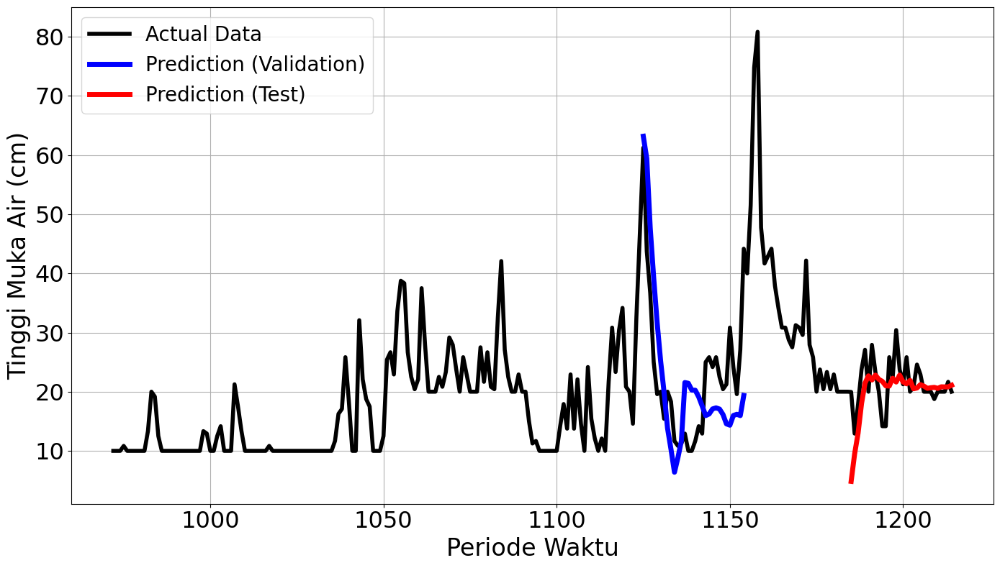

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5401
Final Average MAPE Test: 0.6808
Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.5838 - val_loss: 0.1007
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step - loss: 0.0349 - val_loss: 0.1040
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0278 - val_loss: 0.2628
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - loss: 0.0330 - val_loss: 0.1497
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - loss: 0.0099 - val_loss: 0.1011
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0186Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.0186 - val_loss: 0.1400
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
mape validation = 91.84232092404999 %
mape test = 95.35967914962042 %


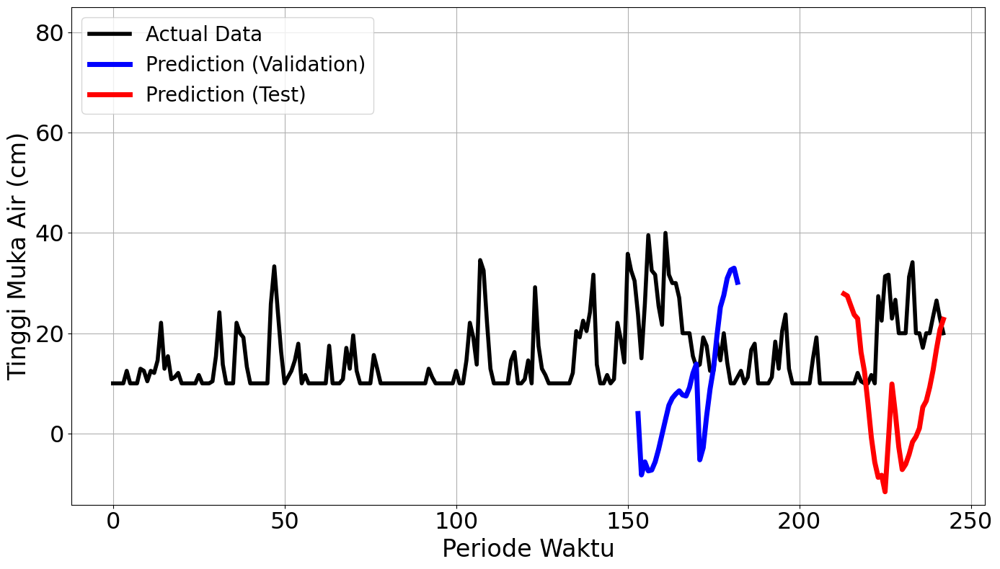

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.3707 - val_loss: 0.4397
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step - loss: 0.6991 - val_loss: 0.0885
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0940 - val_loss: 0.1099
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.0284 - val_loss: 0.1762
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step - loss: 0.0777 - val_loss: 0.1184
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.0470 - val_loss: 0.0572
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step - loss: 0.0229 - val_loss: 0.0443
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - loss: 0.0267 - val_loss: 0.0623
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step - loss: 0.0345 - val_loss: 0.0457
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - loss: 0.0266 - val_loss: 0.0341
Epoch 11/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step - loss: 0.0184 - val_loss: 0.0337
Epoch 12/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0209 - val_loss:

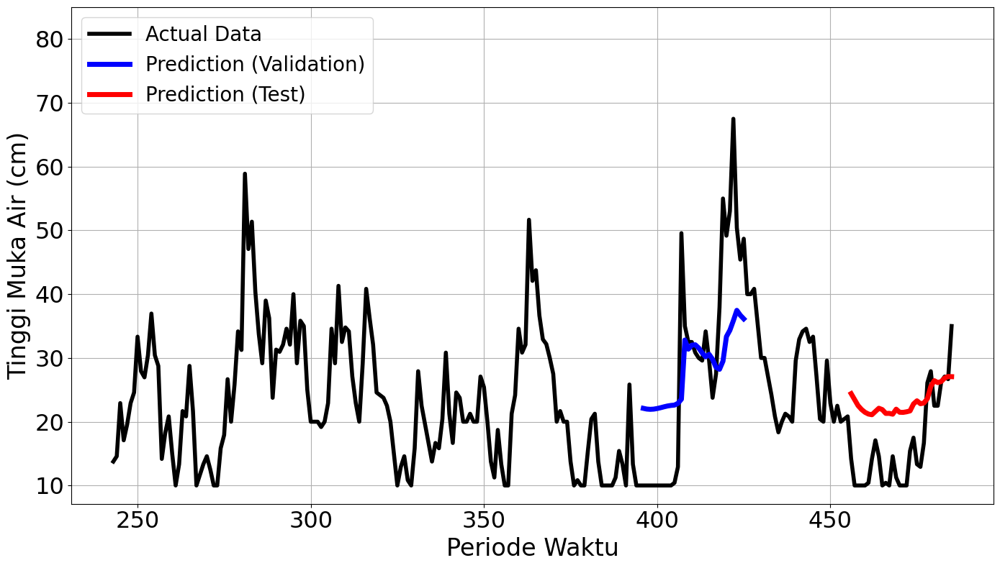

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.4453 - val_loss: 0.0082
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step - loss: 0.0140 - val_loss: 0.0806
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.0909 - val_loss: 0.0941
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - loss: 0.0799 - val_loss: 0.0512
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - loss: 0.0441 - val_loss: 0.0016
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - loss: 0.0053 - val_loss: 0.0205
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - loss: 0.0377 - val_loss: 0.0166
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - loss: 0.0333 - val_loss: 0.0040
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step - loss: 0.0116 - val_loss: 0.0240
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - loss: 0.0202Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - loss: 0.0202 - val_loss: 0.0273
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s

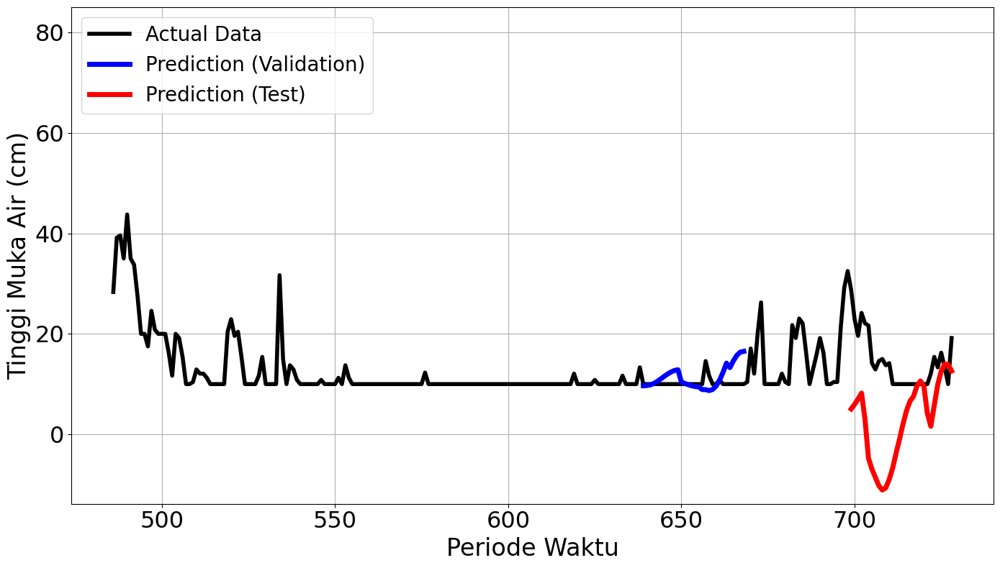

Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2826 - val_loss: 0.2169
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.7605 - val_loss: 0.2156
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - loss: 0.6086 - val_loss: 0.1350
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - loss: 0.1208 - val_loss: 0.0777
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - loss: 0.1008 - val_loss: 0.0168
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step - loss: 0.0250 - val_loss: 0.0225
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0420 - val_loss: 0.0251
Epoch 8/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.0393 - val_loss: 0.0184
Epoch 9/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0187 - val_loss: 0.0225
Epoch 10/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0177Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - loss: 0.0177 - val_loss: 0.0312
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s

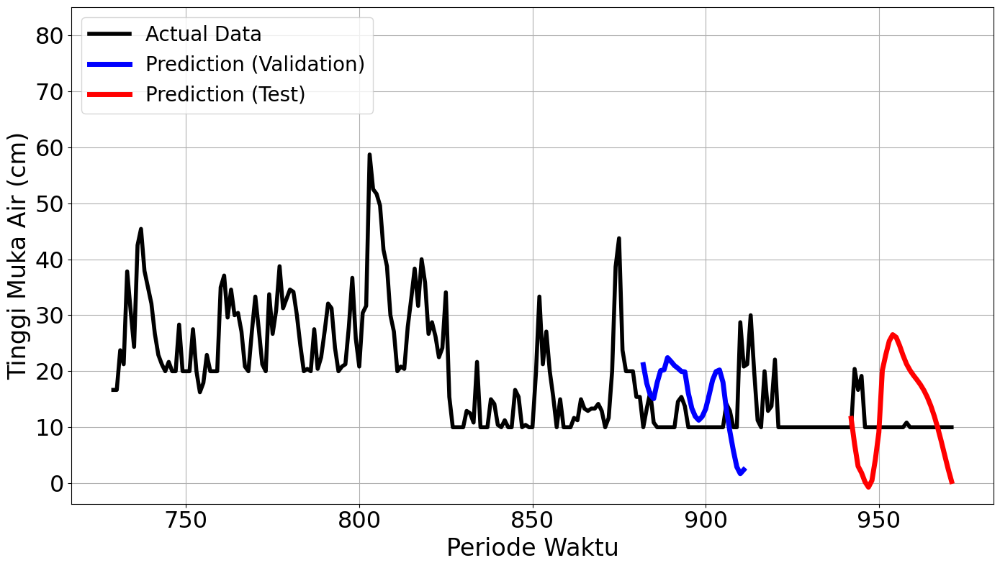

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 0.2712 - val_loss: 0.2197
Epoch 2/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - loss: 0.1625 - val_loss: 0.0187
Epoch 3/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.0782 - val_loss: 0.0666
Epoch 4/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0410 - val_loss: 0.0832
Epoch 5/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - loss: 0.0485 - val_loss: 0.0614
Epoch 6/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.0520 - val_loss: 0.0390
Epoch 7/150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0229Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - loss: 0.0229 - val_loss: 0.0279
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
mape validation = 40.92314700085697 %
mape test = 15.76078156661259 %


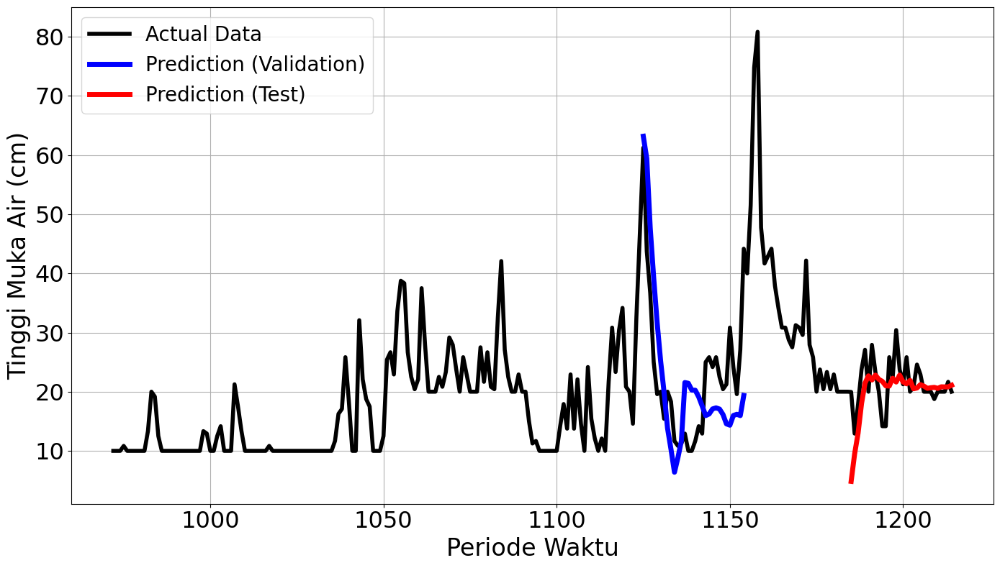

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.5401
Final Average MAPE Test: 0.6808


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter Sliding Window Cross Validation
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [1, 16, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  for i in range(n_windows1):
      start = i * shift
      end = start + window_size
      if end > n_total:
          print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
          break

      window_data = data_series[start:end] # sliding window
      train_and_val = window_data[:n_train_and_val]
      train = train_and_val[:n_train]
      val = train_and_val[n_train:]
      test = window_data[n_train_and_val:]

      try:

          train_generator = TimeseriesGenerator(train, train, length=look_back, batch_size=bsize)

          val_generator = TimeseriesGenerator(val, val, length=look_back, batch_size=bsize)

          test_generator = TimeseriesGenerator(test, test, length=look_back, batch_size=bsize)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=150, validation_data=val_generator, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          val_true = val[look_back:]
          val_true_descale = scaler.inverse_transform(val_true).flatten()
          mape_val = mean_absolute_percentage_error(val_true_descale, val_predictions_descale)

          test_true = test[look_back:]
          test_true_descale = scaler.inverse_transform(test_true).flatten()
          mape_test = mean_absolute_percentage_error(test_true_descale, test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          start_idx = start
          X_actual = np.arange(start_idx, start_idx + len(train) + len(val) + len(test))
          X_val = np.arange(start_idx + len(train) + look_back, start_idx + len(train) + len(val))
          X_test = np.arange(start_idx + len(train) + len(val) + look_back, start_idx + len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left')  # legend untuk setiap subplot
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

      except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # Setelah loop selesai semua
  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (SWCV)

In [11]:
# 1. Buat semua kombinasi hyperparameter
parameter_combinations = list(itertools.product(*config_params.values()))

# 2. Buat DataFrame ringkasan dengan kolom nilai MAPE dan kombinasi param
hyperparameter_summary = pd.DataFrame({
    "mape_vals": average_mape_vals_by_param,
    "mape_tests": average_mape_tests_by_param,
    "param_combo": parameter_combinations  # Masukkan kombinasi ke kolom DataFrame
})

# 3. Urutkan berdasarkan mape_tests (terkecil ke terbesar)
hyperparameter_summary_sorted = hyperparameter_summary.sort_values(by="mape_tests").reset_index(drop=True)

# 4. Ubah param_combo (tuple) menjadi dict agar readable
hyperparameter_summary_sorted["param_dict"] = hyperparameter_summary_sorted["param_combo"].apply(
    lambda combo: {k: combo[i] for i, k in enumerate(config_params.keys())}
)

# 5. Tampilkan seluruh kombinasi dalam urutan performa terbaik
for i, row in hyperparameter_summary_sorted.iterrows():
    print(f"Rank {i+1}:")
    print(f"  MAPE (val):  {row['mape_vals']:.6f}")
    print(f"  MAPE (test): {row['mape_tests']:.6f}")
    print(f"  Params:      {row['param_dict']}")
    print("-" * 40)

Rank 1:
  MAPE (val):  0.244968
  MAPE (test): 0.318394
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 2:
  MAPE (val):  0.244968
  MAPE (test): 0.318394
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 3:
  MAPE (val):  0.262724
  MAPE (test): 0.353834
  Params:      {'learning_rate': 0.005, 'batch_size': 16, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 4:
  MAPE (val):  0.262724
  MAPE (test): 0.353834
  Params:      {'learning_rate': 0.005, 'batch_size': 16, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 5:
  MAPE (val):  0.327378
  MAPE (test): 0.372046
  Params:      {'learning_rate': 0.005, 'batch_size': 64, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
------------------------------------

### Best Parameter (SWCV)

In [12]:
best_param = {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}

In [13]:
def create_model(neurons, learning_rate, init_scheme='glorot_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        kernel_initializer=init_scheme,
        input_shape=(time_step, 1)
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [16]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[972:1215].reset_index(drop=True)

train_data = data.iloc[:123]
val_data = data.iloc[123:183]
test_data = data.iloc[183:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 123
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'glorot_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=1,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/40


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/40
Epoch 3/40
Epoch 4/40
Epoch 5/40
Epoch 6/40
Epoch 7/40
Epoch 8/40
Epoch 9/40
Epoch 10/40
Epoch 11/40
Epoch 12/40
Epoch 13/40
Epoch 14/40
Epoch 15/40
Epoch 16/40
Epoch 17/40
Epoch 18/40
Epoch 19/40
Epoch 20/40
Epoch 21/40
Epoch 22/40
Epoch 23/40
Epoch 24/40
Epoch 25/40
Epoch 26/40
Epoch 27/40
Epoch 28/40
Epoch 29/40
Epoch 30/40
Epoch 31/40
Epoch 32/40
Epoch 33/40
Epoch 34/40
Epoch 35/40
Epoch 36/40
Epoch 37/40
Epoch 38/40
Epoch 39/40
Epoch 40/40


### Plot Model Loss

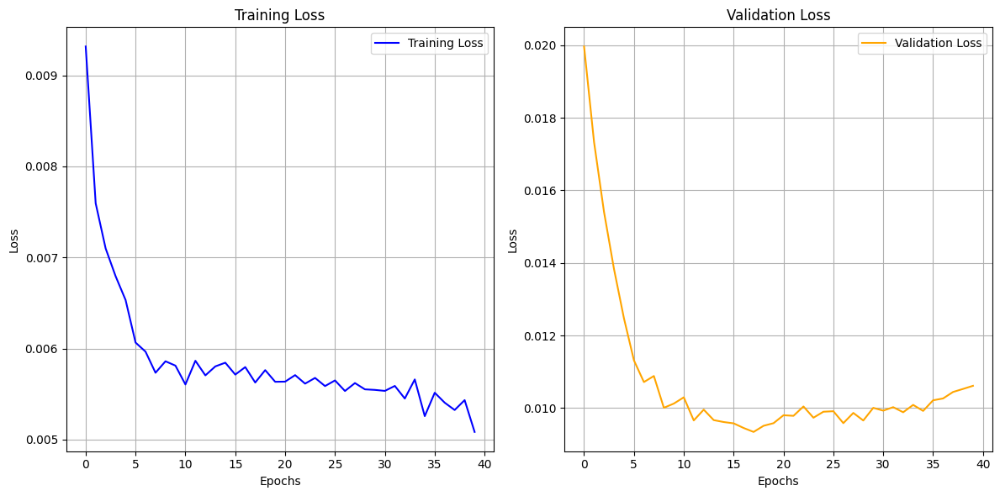

In [17]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

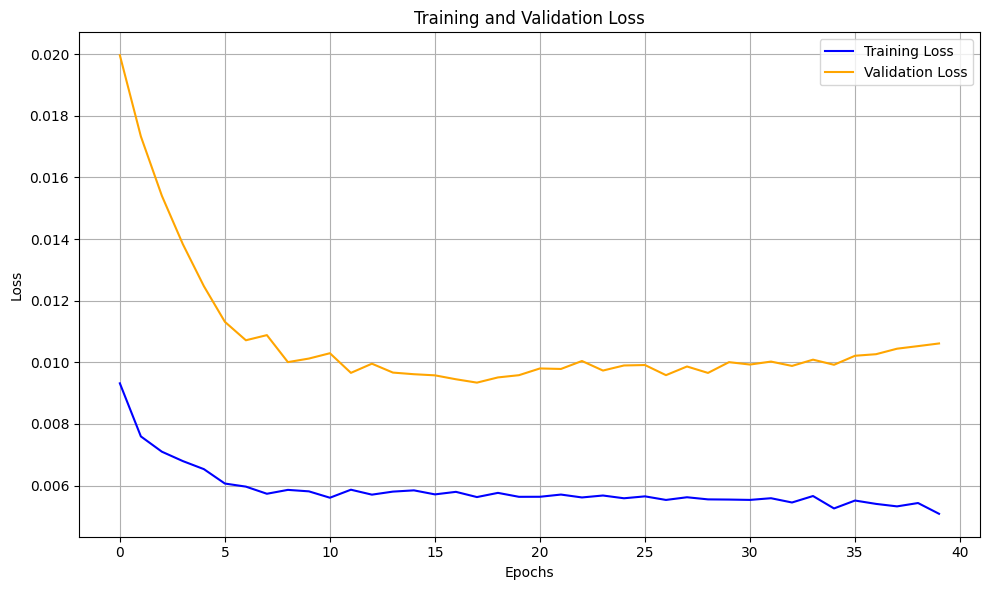

In [18]:
import matplotlib.pyplot as plt

# Membuat plot gabungan training dan validation loss
plt.figure(figsize=(10, 6))

plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')

plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

### MAPE Train

In [19]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [20]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


0.21728665990302176

### Plot Train Actual vs Predicted

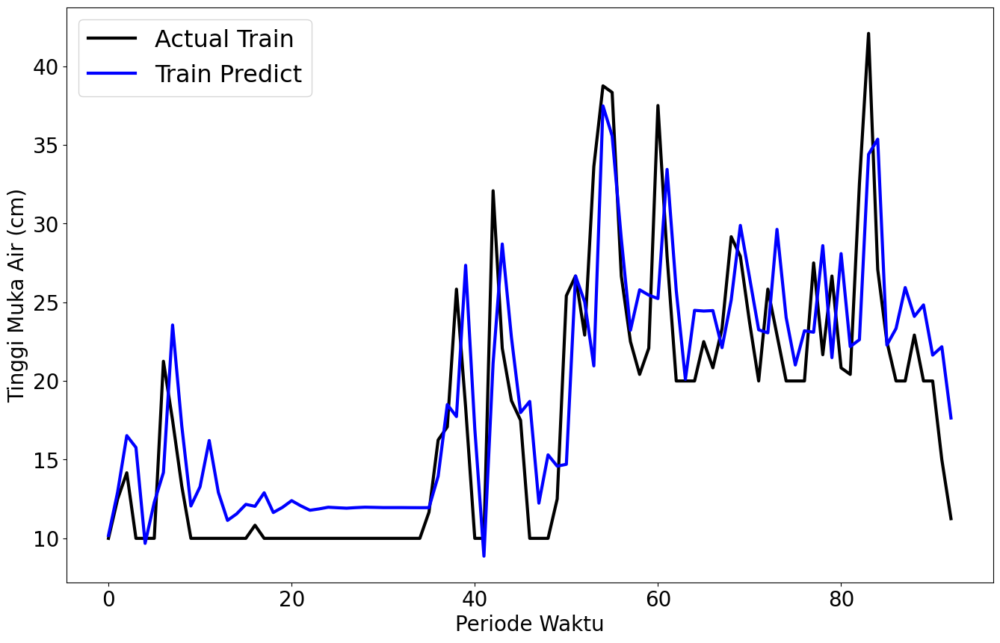

In [21]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'blue')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 23)
plt.show()